In [4]:
import torch
from torch import nn
import torch.nn.functional as F
import torch.distributions as D
import numpy as np
import matplotlib.pyplot as plt
import collections
import time

from data.gp_curves import GPSeqCurvesReader
from src.rnn_np import ANP_RNN_Model

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Results 3 Contexts, stacking encoder

In [16]:
def plot_functions(num_context, left_interval, len_seqs, full, target_x, target_y, context_x, context_y, pred_y, var):
    """Plots the predicted mean and variance and the context points.

    Args: 
    num_context: Int, the number of conext time-series.
    left_interval: List, the left most point of the interval of the context
    len_seqs:
    full: the full GP draw for plotting (batchsize x L x 1)
    target_x: An array of shape batchsize x number_targets x 1 that contains the
        x values of the target points.
    target_y: An array of shape batchsize x number_targets x 1 that contains the
        y values of the target points.
    context_x: An array of shape batchsize x number_context x 1 x num_context that contains 
        the x values of the context points.
    context_y: An array of shape batchsize x number_context x 1 x num_context that contains 
        the y values of the context points.
    pred_y: An array of shape batchsize x number_targets x 1  that contains the
        predicted means of the y values at the target points in target_x.
    pred_y: An array of shape batchsize x number_targets x 1  that contains the
        predicted variance of the y values at the target points in target_x.
    """
    # Get lengths of context and targets, x and y
    lens = []
    for l in len_seqs:
        if len(lens) == 0:
            lens.append(l)
        else:
            lens.append(l + lens[-1])
            
    # Context
    context_colours = ['royalblue', 'forestgreen', 'darkorange']
    for i in range(num_context):
        plt.plot(range(left_interval[i], left_interval[i] + len_seqs[0]),
                 context_x[0, :, 0, i], color=context_colours[i], markersize=2, label="context_x {}".format(i+1))
        plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
                 context_y[0, :, 0, i], 'k:', color=context_colours[i], markersize=2, label="context_y {}".format(i+1))
    # Target    
    plt.plot(range(left_interval[-1], left_interval[-1] + len_seqs[2]),
             target_x[0, :, 0], 'ko', color='purple', linewidth=2, label="target_x")
    plt.plot(range(left_interval[-1] + len_seqs[2], left_interval[-1] + len_seqs[2] + len_seqs[3]), 
             target_y[0, :, 0], 'ko', color='lightpink', linewidth=2, label="target_y")
    
    
    # Prediction
    # +1 to the range on the right interval since there are len+1 predictions made by the decoder
    plt.plot(range(left_interval[-1] + len_seqs[2], left_interval[-1] + len_seqs[2] + len_seqs[3] + 1), 
             pred_y[0, :, 0], 'blue', label="pred")
    
    plt.fill_between(
      range(left_interval[-1] + len_seqs[2], left_interval[-1] + len_seqs[2] + len_seqs[3] + 1),
      pred_y[0, :, 0] - var[0, :, 0],
      pred_y[0, :, 0] + var[0, :, 0],
      alpha=0.2,
      color='blue',
      interpolate=True)
    
    # Full
    plt.plot(range(full.shape[1]), full[0, :, 0], 'k:', color='grey')

    plt.legend()

    plt.grid('off')
    ax = plt.gca()
    #ax.set_axis_bgcolor('white')
    plt.show()

Update time per iter 0.05
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 4, 1])
Iteration: 0, loss: 5.948524475097656
pred_y: torch.Size([1, 1, 1])


C:\Users\grado\AppData\Local\Temp\ipykernel_24400\1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
C:\Users\grado\AppData\Local\Temp\ipykernel_24400\1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "ko" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[-1], left_interval[-1] + len_seqs[2]),
C:\Users\grado\AppData\Local\Temp\ipykernel_24400\1575985254.py:40: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "ko" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[-1] + len_seqs[2], left_interval[-1] + len_seqs[2] + len_seqs[3]),


ValueError: x and y must have same first dimension, but have shapes (5,) and (1,)

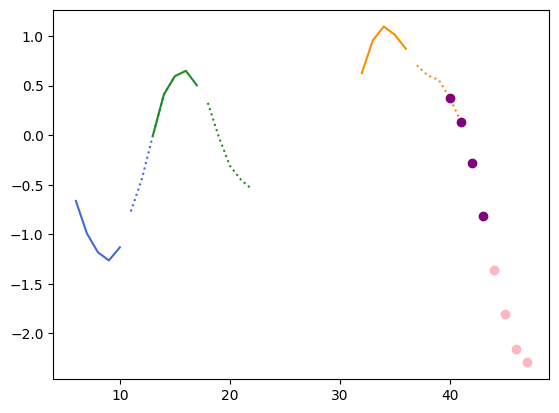

In [17]:
TRAINING_ITERATIONS = int(2e5)
PLOT_AFTER = int(1e3)
num_context = 3
len_context = 6
batch_size = 100
# The final output layer of the decoder outputs two values, one for the mean and
# one for the variance of the prediction at the target location
encoder_output_sizes = [64, 64]
decoder_output_sizes = [64, 64]
embedding_dim = 64
latent_dim = 4

# Define the model
encoder_input_size = 1 + 1 # x and y pairs are encoder into the context
decoder_input_size = 64 + 1 + 1 # target is concatenated onto the representation as input into the decoder
model = ANP_RNN_Model(x_dim=1,
                      y_dim=1,
                      encoder_rnn_hidden_size_list=encoder_output_sizes,
                      decoder_rnn_hidden_size_list=decoder_output_sizes,
                      embedding_dim=embedding_dim,
                      latent_dim=latent_dim,
                      )

model = model.to(device)

# Set up the optimizer and train step
optimizer = torch.optim.Adam(model.parameters(), lr=1e-5)

timings = collections.deque(maxlen=10)
losses = []

for it in range(TRAINING_ITERATIONS):
    start_time = time.time()
    
    # Train dataset
    dataset_train = GPSeqCurvesReader(batch_size=batch_size, 
                                      num_contexts=num_context,
                                      len_context_x=len_context,
                                      len_context_y=len_context,
                                      len_target_x=len_context,
                                      len_target_y=len_context,
                                      testing=False)
    data_train = dataset_train.generate_curves()

    # Test dataset
    dataset_test = GPSeqCurvesReader(batch_size=1,
                                     num_contexts=num_context,
                                     len_context_x=len_context,
                                     len_context_y=len_context,
                                     len_target_x=len_context,
                                     len_target_y=len_context,
                                     testing=False)
    data_test = dataset_test.generate_curves()
    
    (context_x, context_y), target_x = data_train.query
    
    context_x = context_x.to(device)
    context_y = context_y.to(device)
    target_x  = target_x.to(device)
    target_y  = data_train.target_y.to(device)
    
    _, _, loss, _ = model.forward(
            context_x,
            context_y,
            target_x,
            target_y,
        )
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    
    timings.append(time.time() - start_time)

    # Plot the predictions in `PLOT_AFTER` intervals
    if it % PLOT_AFTER == 0:
        
        print("Update time per iter {:.2f}".format(np.mean(timings)))
        
        (context_x, context_y), target_x = data_test.query
        context_x = context_x.to(device)
        context_y = context_y.to(device)
        target_x  = target_x.to(device)
        target_y  = data_test.target_y.to(device)
        
        # Get the predicted mean and variance at the target points for the testing set
        print("Context x: {}".format(context_x.shape))
        print("Context y: {}".format(context_y.shape))
        print("target x: {}".format(target_x.shape))
        print("target y: {}".format(target_y.shape))
        pred_y, var, loss,_ = model.forward(
            context_x,
            context_y,
            target_x,
            target_y)
        test_loss = loss.detach().item()
        losses.append(loss)
        print('Iteration: {}, loss: {}'.format(it, test_loss))
        print("pred_y: {}".format(pred_y.shape))
        # Plot the prediction and the context
        plot_functions(
            num_context,
            data_test.left_intervals,
            data_test.len_seqs,
            data_test.full,
            target_x.cpu().numpy(),
            target_y.cpu().numpy(),
            context_x.cpu().numpy(),
            context_y.cpu().numpy(),
            pred_y.cpu().numpy(),
            var.cpu().numpy(),
            
        )

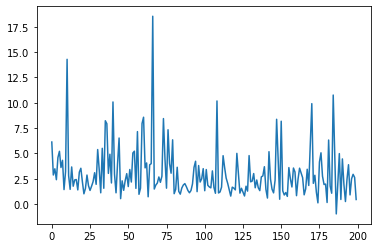

In [6]:
plt.plot([l.cpu().detach().numpy() for l in losses])
plt.show()

# Results Multiple Contexts, Appending encoder

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 2, 1])
Iteration: 0, loss: 1.0101830959320068
pred_y: torch.Size([1, 3, 1])


/nfs/home/samuelk/ml4f/data/gp_curves.py:263: UserWarning: torch.cholesky is deprecated in favor of torch.linalg.cholesky and will be removed in a future PyTorch release.
L = torch.cholesky(A)
should be replaced with
L = torch.linalg.cholesky(A)
and
U = torch.cholesky(A, upper=True)
should be replaced with
U = torch.linalg.cholesky(A).mH().
This transform will produce equivalent results for all valid (symmetric positive definite) inputs. (Triggered internally at  /opt/conda/conda-bld/pytorch_1646756402876/work/aten/src/ATen/native/BatchLinearAlgebra.cpp:1337.)
  cholesky = torch.cholesky(kernel.type(torch.DoubleTensor)).type(torch.FloatTensor)
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: 

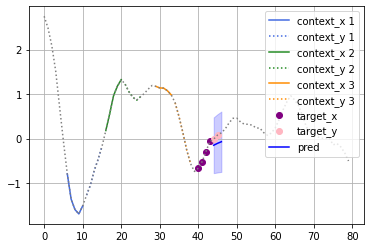

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 3, 1])
Iteration: 1000, loss: 3.6407346725463867
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

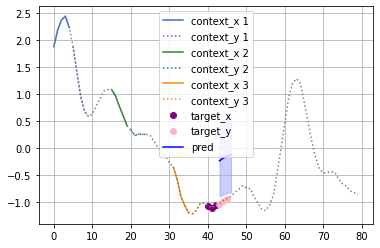

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 5, 1])
Iteration: 2000, loss: 6.420498847961426
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

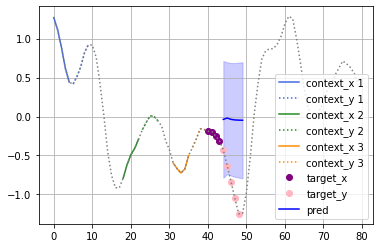

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 3, 1])
Iteration: 3000, loss: 1.7437424659729004
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

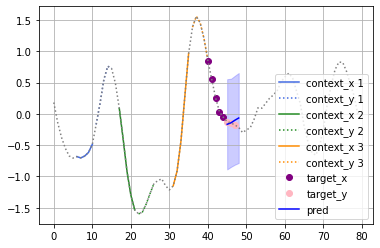

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 2, 1])
Iteration: 4000, loss: 6.54928731918335
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

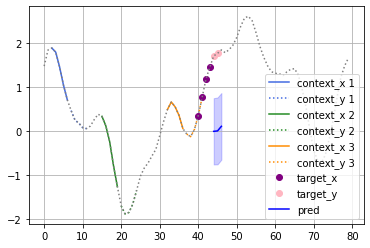

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 5, 1])
Iteration: 5000, loss: 3.704224109649658
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

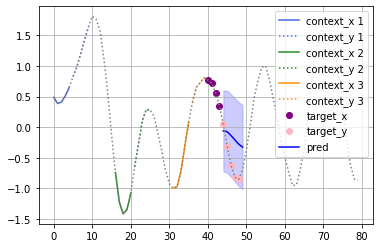

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 5, 1])
Iteration: 6000, loss: 8.219316482543945
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

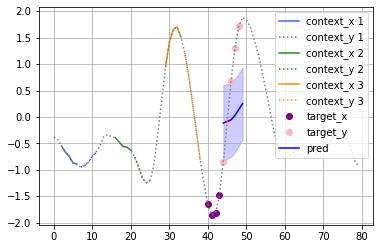

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 5, 1])
Iteration: 7000, loss: 19.67242431640625
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

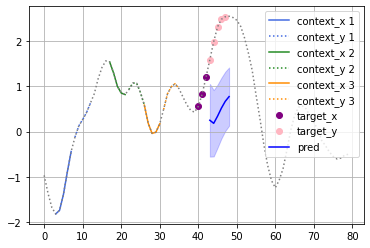

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 5, 1])
Iteration: 8000, loss: 4.798086166381836
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

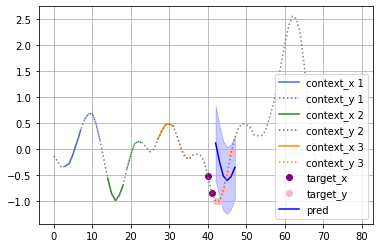

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 5, 1])
Iteration: 9000, loss: 3.6553757190704346
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

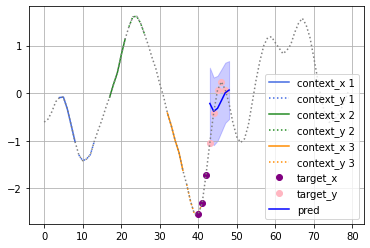

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 3, 1])
Iteration: 10000, loss: 4.218573570251465
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

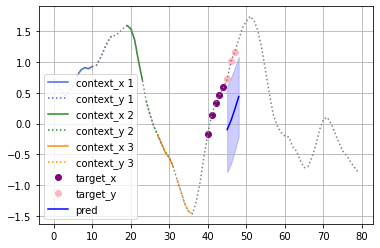

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 5, 1])
Iteration: 11000, loss: 3.026341199874878
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

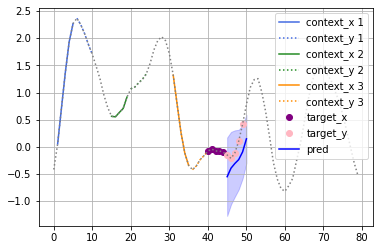

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 5, 1])
Iteration: 12000, loss: 1.8463878631591797
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

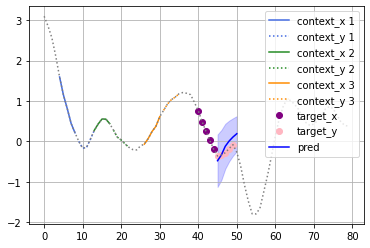

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 4, 1])
Iteration: 13000, loss: 2.9989538192749023
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

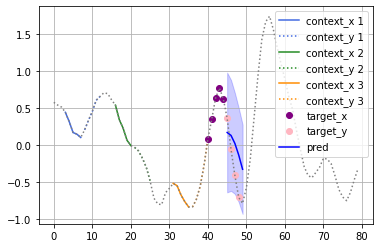

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 2, 1])
Iteration: 14000, loss: 1.733320713043213
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

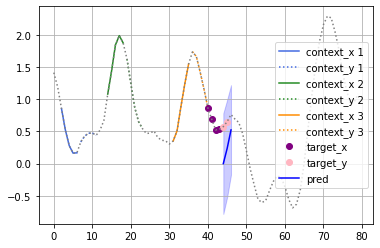

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 3, 1])
Iteration: 15000, loss: 1.471405267715454
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

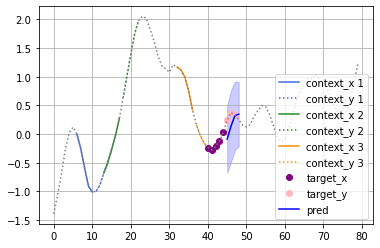

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 3, 1])
Iteration: 16000, loss: 2.318671226501465
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

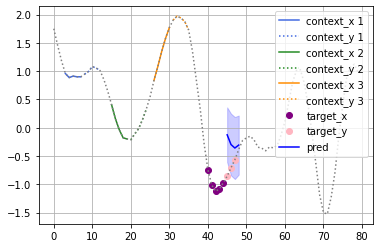

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 4, 1])
Iteration: 17000, loss: 1.8010238409042358
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

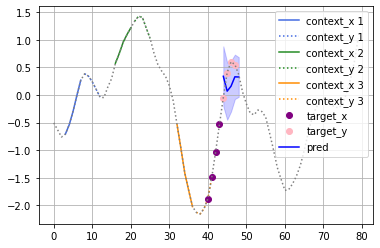

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 2, 1])
Iteration: 18000, loss: 5.1503376960754395
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

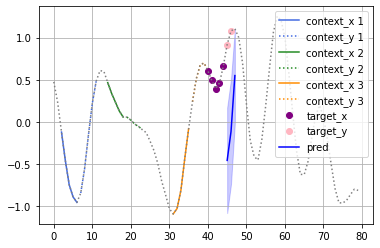

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 3, 1])
Iteration: 19000, loss: 2.4112231731414795
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

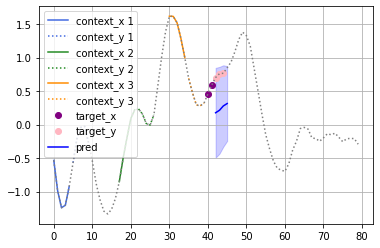

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 3, 1])
Iteration: 20000, loss: 2.570220470428467
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

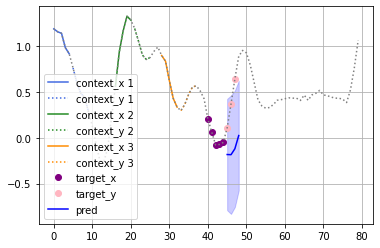

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 4, 1])
Iteration: 21000, loss: 3.1374340057373047
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

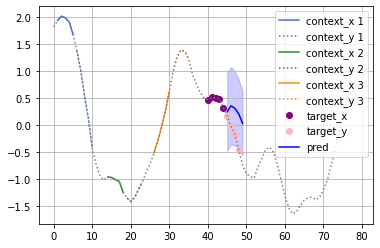

Update time per iter 0.05
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 4, 1])
Iteration: 22000, loss: 10.710223197937012
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

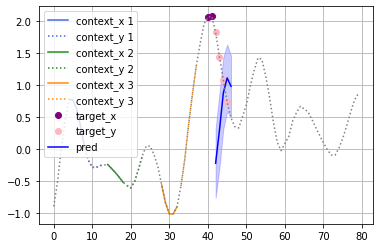

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 2, 1])
Iteration: 23000, loss: 1.3698482513427734
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

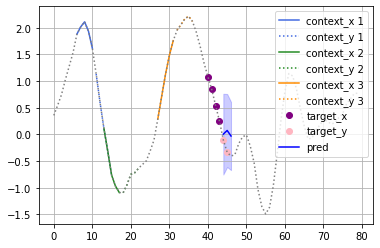

Update time per iter 0.05
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 3, 1])
Iteration: 24000, loss: 2.6963279247283936
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

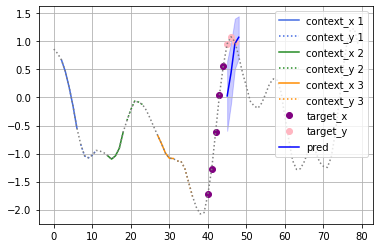

Update time per iter 0.05
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 4, 1])
Iteration: 25000, loss: 4.030036449432373
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

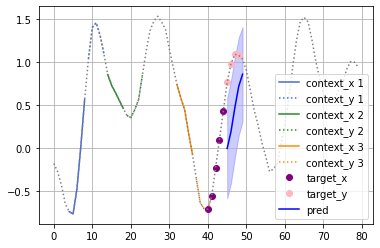

Update time per iter 0.05
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 3, 1])
Iteration: 26000, loss: 3.191807508468628
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

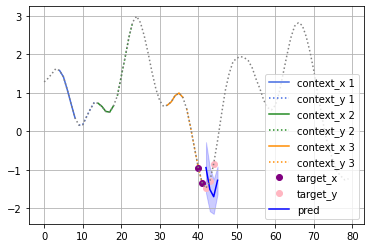

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 2, 1])
Iteration: 27000, loss: 4.850952625274658
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

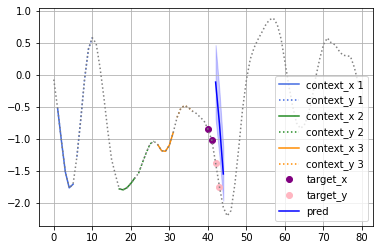

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 3, 1])
Iteration: 28000, loss: 1.5410053730010986
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

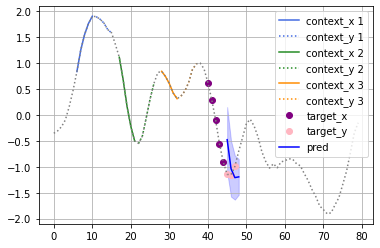

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 4, 1])
Iteration: 29000, loss: 3.1109018325805664
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

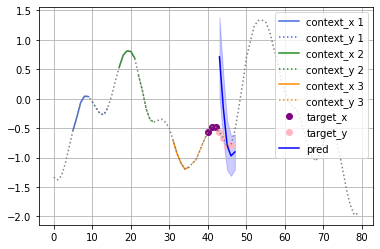

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 5, 1])
Iteration: 30000, loss: 27.04444694519043
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

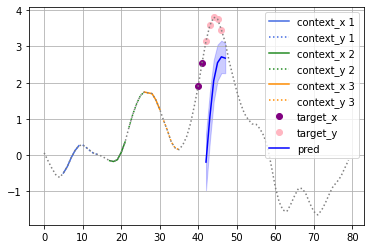

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 2, 1])
Iteration: 31000, loss: 1.741870403289795
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

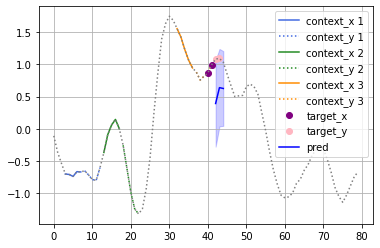

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 2, 1])
Iteration: 32000, loss: 3.619384288787842
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

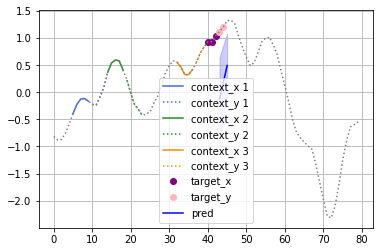

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 3, 1])
Iteration: 33000, loss: 2.8036587238311768
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

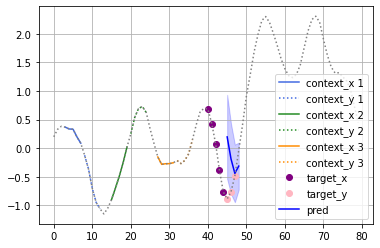

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 4, 1])
Iteration: 34000, loss: 1.2668230533599854
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

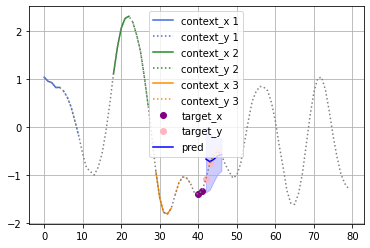

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 2, 1])
Iteration: 35000, loss: 0.6188468933105469
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

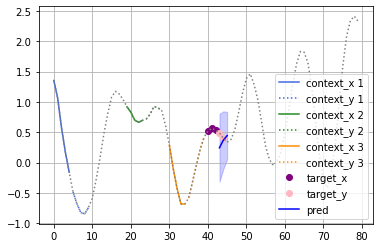

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 3, 1])
Iteration: 36000, loss: 1.151455044746399
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

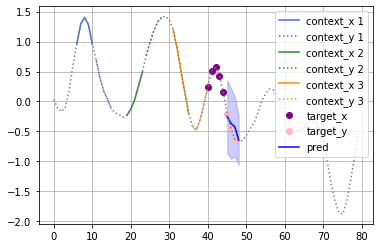

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 2, 1])
Iteration: 37000, loss: 1.5648934841156006
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

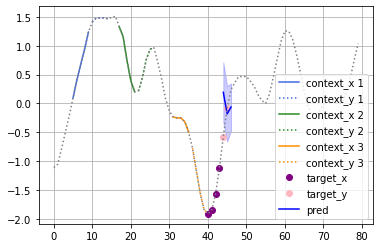

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 5, 1])
Iteration: 38000, loss: 3.6575465202331543
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

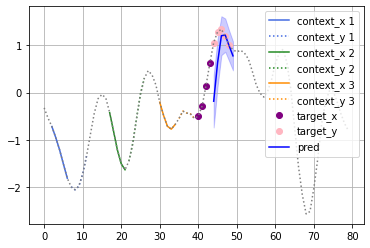

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 2, 1])
Iteration: 39000, loss: 1.512474536895752
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

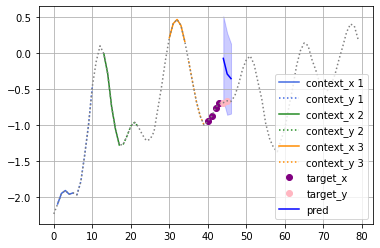

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 3, 1])
Iteration: 40000, loss: 2.060790538787842
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

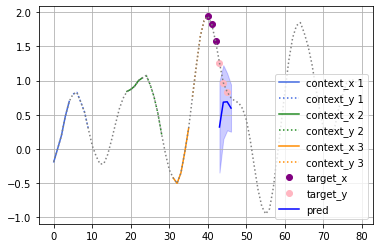

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 4, 1])
Iteration: 41000, loss: 2.5108838081359863
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

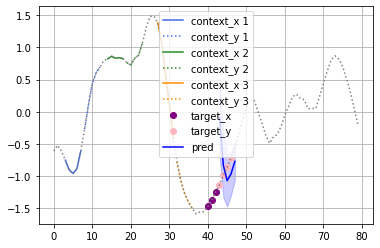

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 3, 1])
Iteration: 42000, loss: 2.557175874710083
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

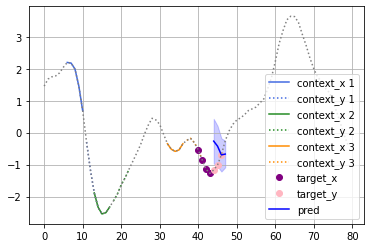

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 2, 1])
Iteration: 43000, loss: 3.1284875869750977
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

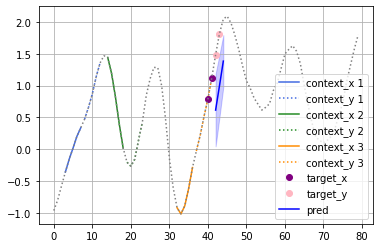

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 3, 1])
Iteration: 44000, loss: 2.701018810272217
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

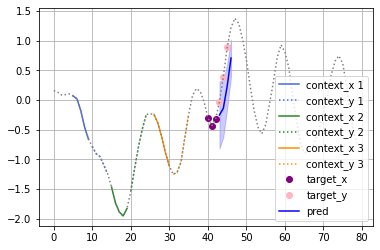

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 3, 1])
Iteration: 45000, loss: 2.805360794067383
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

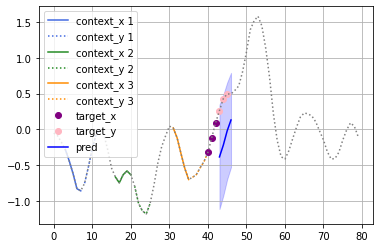

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 4, 1])
Iteration: 46000, loss: 1.1580917835235596
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

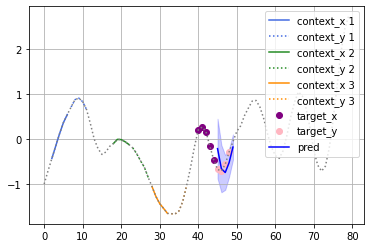

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 4, 1])
Iteration: 47000, loss: 2.9931936264038086
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

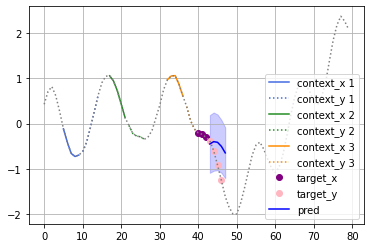

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 5, 1])
Iteration: 48000, loss: 2.675786018371582
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

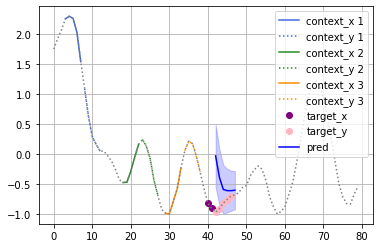

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 3, 1])
Iteration: 49000, loss: 1.6277985572814941
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

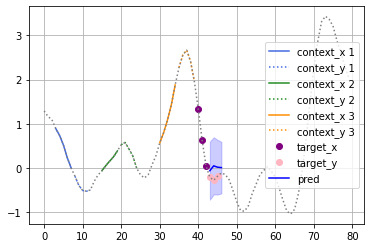

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 2, 1])
Iteration: 50000, loss: 1.1122074127197266
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

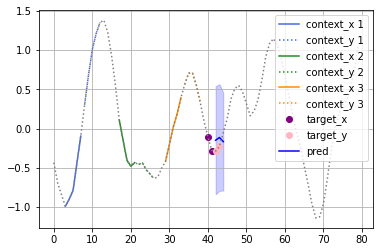

Update time per iter 0.05
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 3, 1])
Iteration: 51000, loss: 1.7856179475784302
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

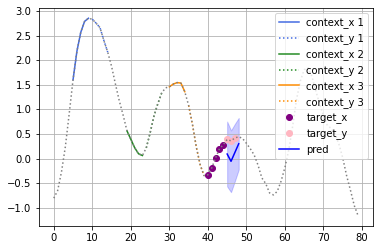

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 2, 1])
Iteration: 52000, loss: 1.2819252014160156
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

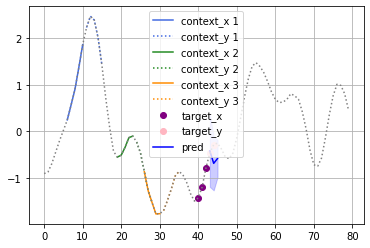

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 4, 1])
Iteration: 53000, loss: 3.977184772491455
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

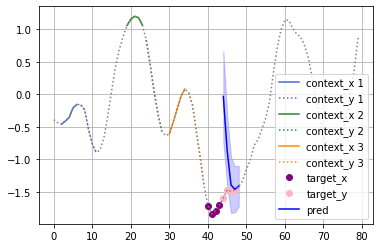

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 4, 1])
Iteration: 54000, loss: 3.562608242034912
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

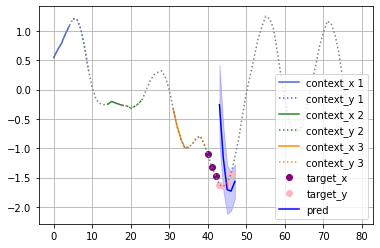

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 3, 1])
Iteration: 55000, loss: 1.1279149055480957
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

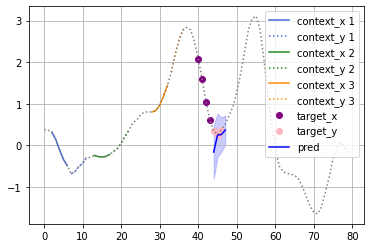

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 3, 1])
Iteration: 56000, loss: 1.4102556705474854
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

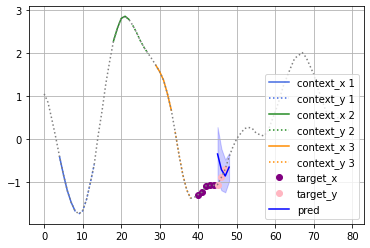

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 4, 1])
Iteration: 57000, loss: 2.5163042545318604
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

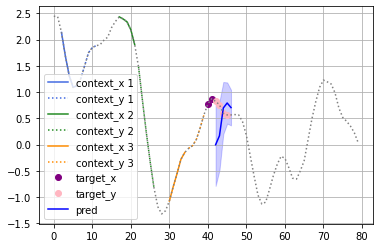

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 4, 1])
Iteration: 58000, loss: 4.68712854385376
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

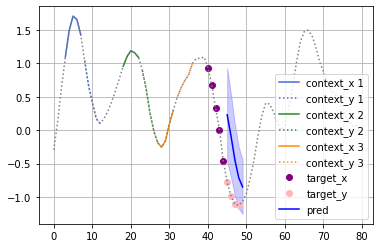

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 3, 1])
Iteration: 59000, loss: 1.5781000852584839
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

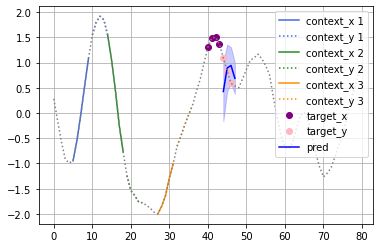

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 4, 1])
Iteration: 60000, loss: 4.225311279296875
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

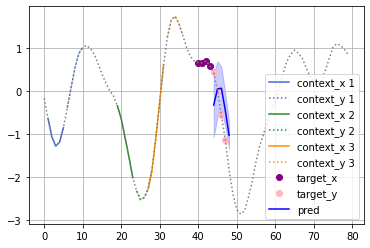

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 3, 1])
Iteration: 61000, loss: 1.6211708784103394
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

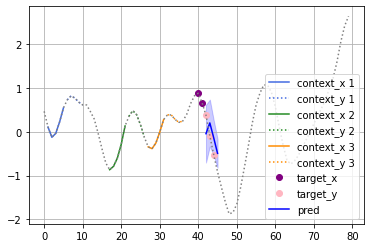

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 5, 1])
Iteration: 62000, loss: 8.60448932647705
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

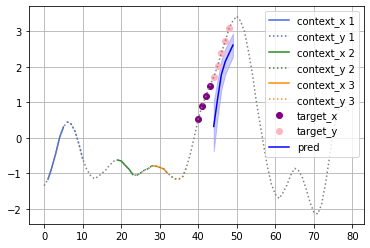

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 5, 1])
Iteration: 63000, loss: 1.628310203552246
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

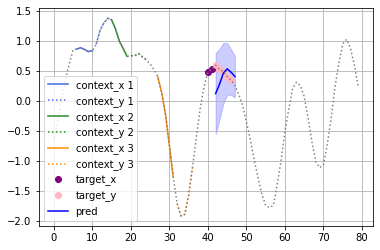

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 5, 1])
Iteration: 64000, loss: 7.936125755310059
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

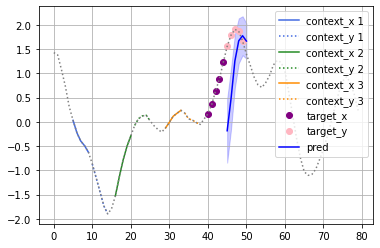

Update time per iter 0.05
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 4, 1])
Iteration: 65000, loss: 2.458144187927246
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

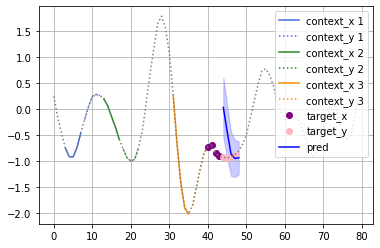

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 5, 1])
Iteration: 66000, loss: 2.4922006130218506
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

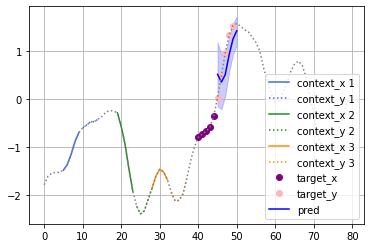

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 4, 1])
Iteration: 67000, loss: 3.966593027114868
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

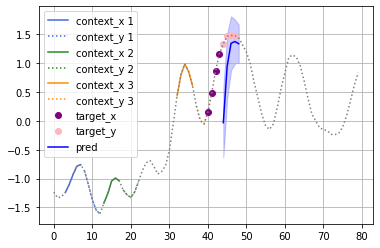

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 5, 1])
Iteration: 68000, loss: 4.383134841918945
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

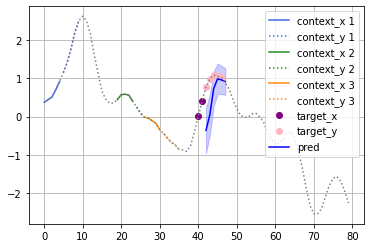

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 4, 1])
Iteration: 69000, loss: 2.265634298324585
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

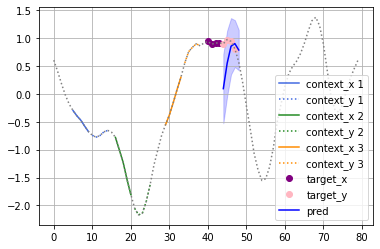

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 2, 1])
Iteration: 70000, loss: 4.180871963500977
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

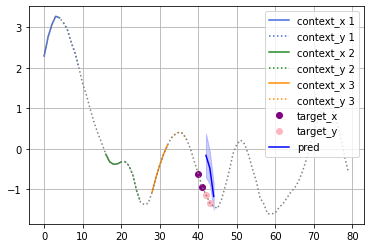

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 5, 1])
Iteration: 71000, loss: 1.5625022649765015
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

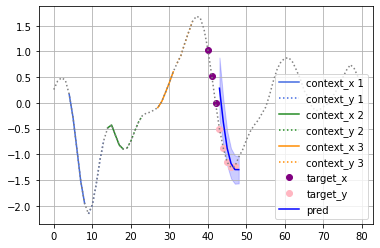

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 3, 1])
Iteration: 72000, loss: 1.9135760068893433
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

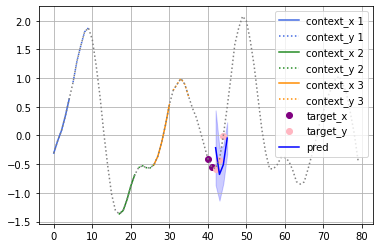

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 3, 1])
Iteration: 73000, loss: 2.470393657684326
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

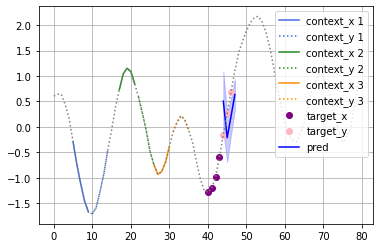

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 5, 1])
Iteration: 74000, loss: 2.5330748558044434
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

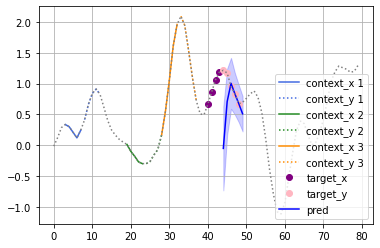

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 3, 1])
Iteration: 75000, loss: 2.3334970474243164
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

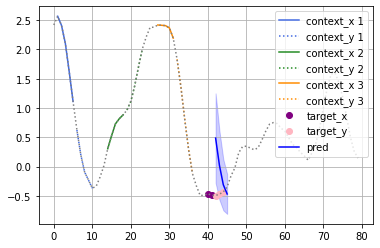

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 4, 1])
Iteration: 76000, loss: 1.8033032417297363
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

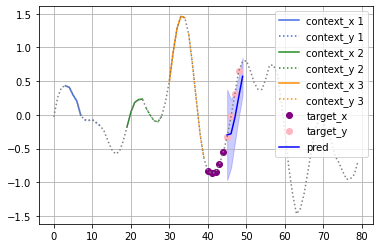

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 3, 1])
Iteration: 77000, loss: 1.2970770597457886
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

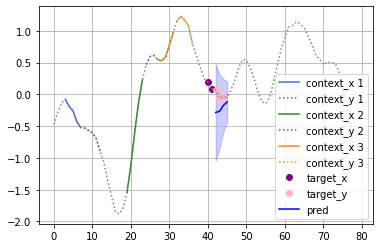

Update time per iter 0.05
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 4, 1])
Iteration: 78000, loss: 0.9768271446228027
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

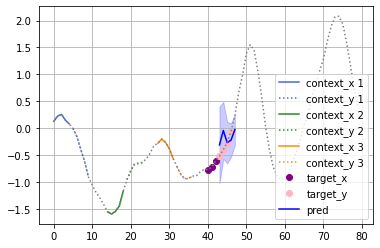

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 5, 1])
Iteration: 79000, loss: 4.243071556091309
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

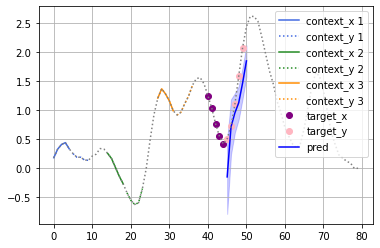

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 5, 1])
Iteration: 80000, loss: 0.35932081937789917
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

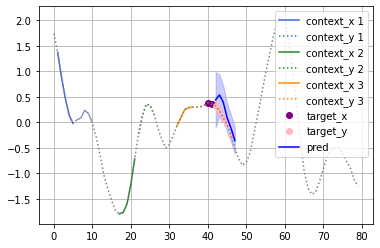

Update time per iter 0.05
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 5, 1])
Iteration: 81000, loss: 0.5126360058784485
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

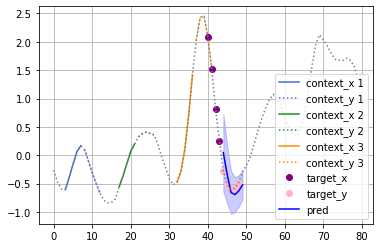

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 3, 1])
Iteration: 82000, loss: 2.351001262664795
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

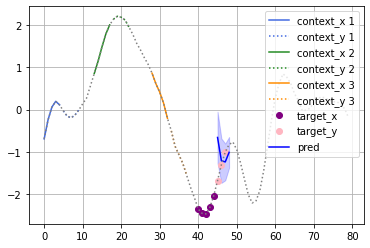

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 3, 1])
Iteration: 83000, loss: 4.293970584869385
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

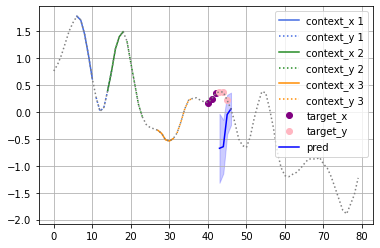

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 2, 1])
Iteration: 84000, loss: 1.021748661994934
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

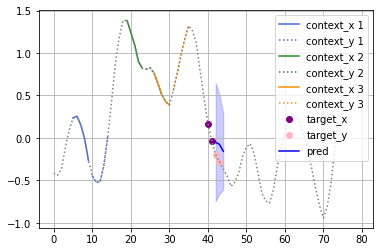

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 3, 1])
Iteration: 85000, loss: 4.8090972900390625
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

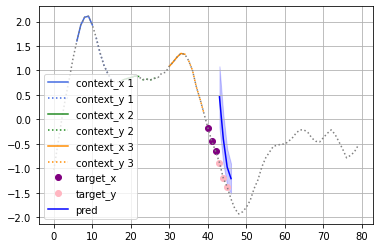

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 5, 1])
Iteration: 86000, loss: 5.476351737976074
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

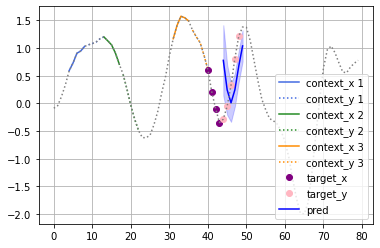

Update time per iter 0.05
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 3, 1])
Iteration: 87000, loss: 0.656859815120697
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

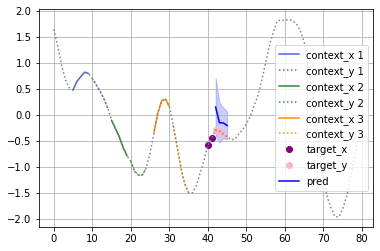

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 2, 1])
Iteration: 88000, loss: 1.3340096473693848
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

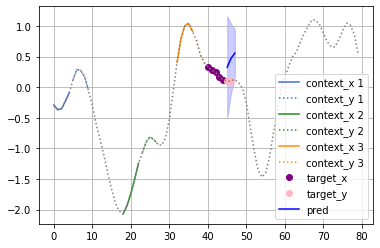

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 5, 1])
Iteration: 89000, loss: 3.8480496406555176
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

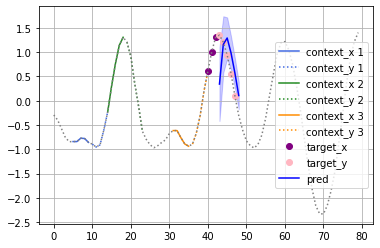

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 3, 1])
Iteration: 90000, loss: 1.1700387001037598
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

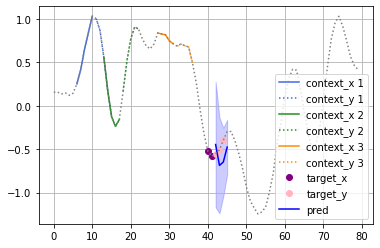

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 3, 1])
Iteration: 91000, loss: 0.7785506248474121
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

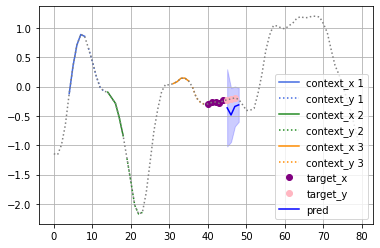

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 2, 1])
Iteration: 92000, loss: 3.607072114944458
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

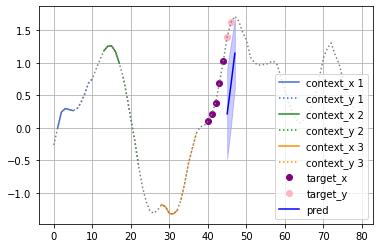

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 5, 1])
Iteration: 93000, loss: 0.9738785028457642
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

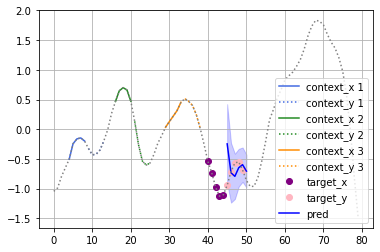

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 3, 1])
Iteration: 94000, loss: 7.221327781677246
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

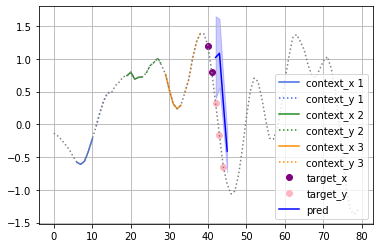

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 4, 1])
Iteration: 95000, loss: 2.770754337310791
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

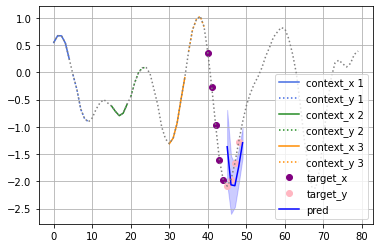

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 3, 1])
Iteration: 96000, loss: 0.7734580636024475
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

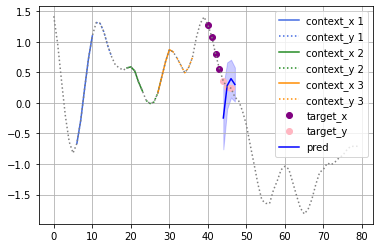

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 3, 1])
Iteration: 97000, loss: 1.2672579288482666
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

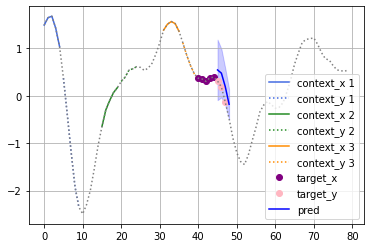

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 4, 1])
Iteration: 98000, loss: 3.6009819507598877
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

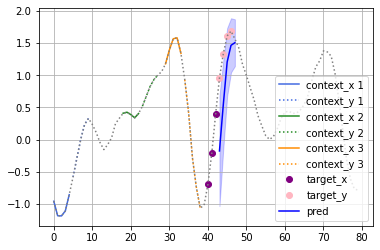

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 4, 1])
Iteration: 99000, loss: 4.133624076843262
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

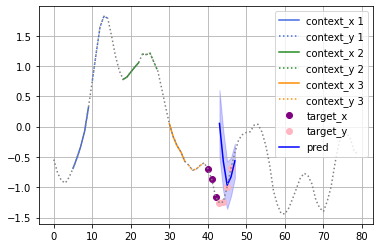

Update time per iter 0.04
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 4, 1])
Iteration: 100000, loss: 2.775602340698242
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

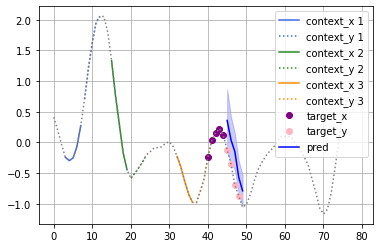

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 3, 1])
Iteration: 101000, loss: 2.6659188270568848
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

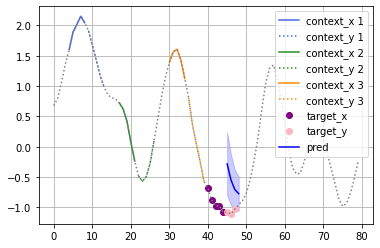

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 2, 1])
Iteration: 102000, loss: 5.110646724700928
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

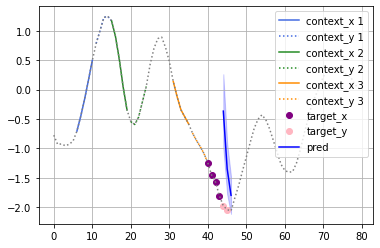

Update time per iter 0.05
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 3, 1])
Iteration: 103000, loss: 0.9773468375205994
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

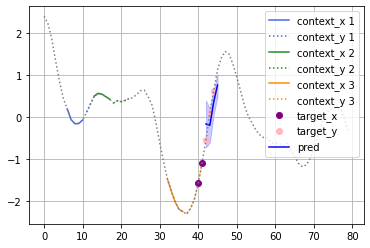

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 4, 1])
Iteration: 104000, loss: 0.6565241813659668
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

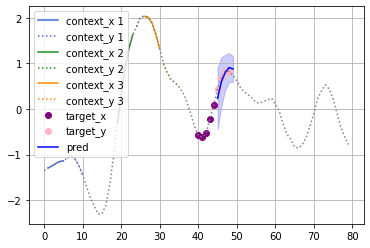

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 3, 1])
Iteration: 105000, loss: 0.5305702686309814
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

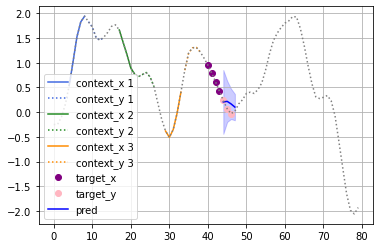

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 2, 1])
Iteration: 106000, loss: 1.1849160194396973
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

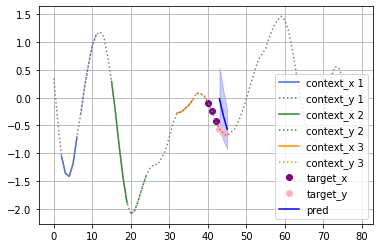

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 4, 1])
Iteration: 107000, loss: 1.7042781114578247
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

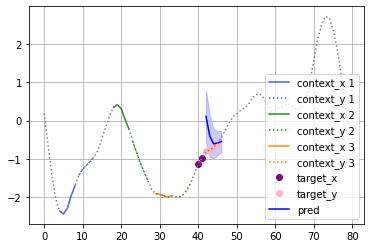

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 3, 1])
Iteration: 108000, loss: 0.8358965516090393
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

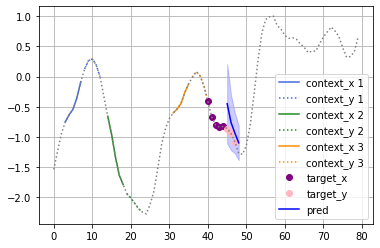

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 5, 1])
Iteration: 109000, loss: 0.799788236618042
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

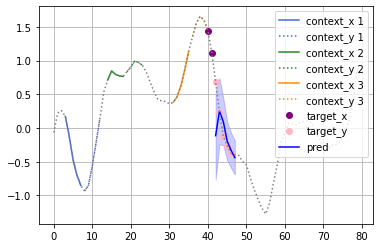

Update time per iter 0.05
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 5, 1])
Iteration: 110000, loss: 0.32712388038635254
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

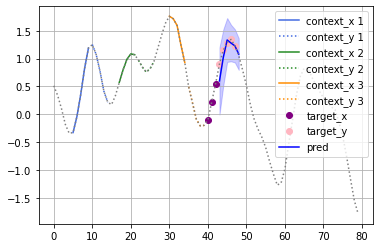

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 2, 1])
Iteration: 111000, loss: 3.1379716396331787
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

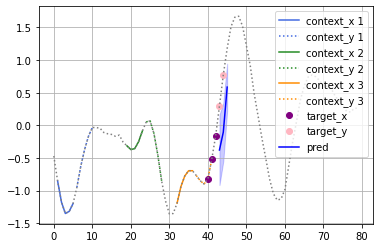

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 5, 1])
Iteration: 112000, loss: 1.5679049491882324
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

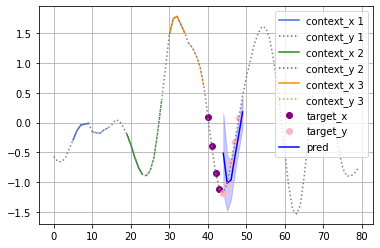

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 5, 1])
Iteration: 113000, loss: 6.206327438354492
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

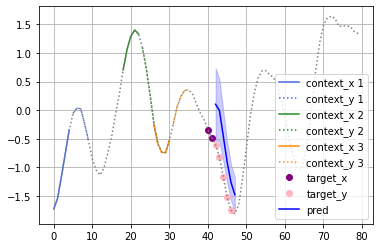

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 4, 1])
Iteration: 114000, loss: 1.5028393268585205
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

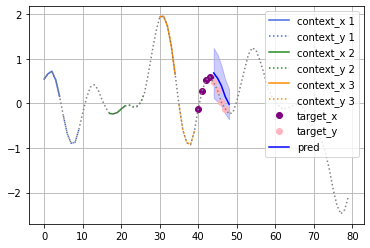

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 5, 1])
Iteration: 115000, loss: 1.9387871026992798
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

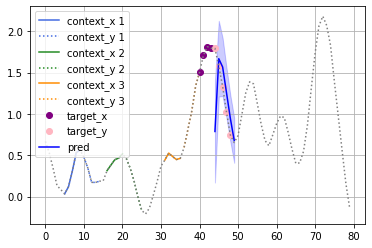

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 4, 1])
Iteration: 116000, loss: 1.2401690483093262
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

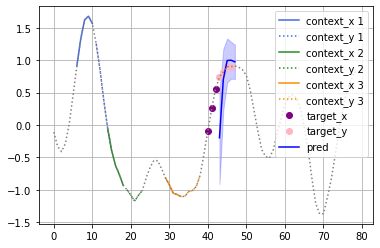

Update time per iter 0.05
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 5, 1])
Iteration: 117000, loss: 9.272998809814453
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

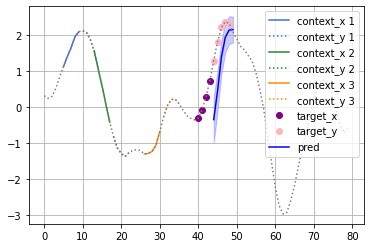

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 4, 1])
Iteration: 118000, loss: 0.7288386821746826
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

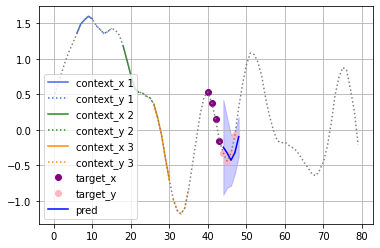

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 5, 1])
Iteration: 119000, loss: 0.5097460746765137
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

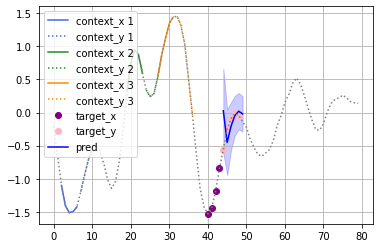

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 3, 1])
Iteration: 120000, loss: 0.6413299441337585
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

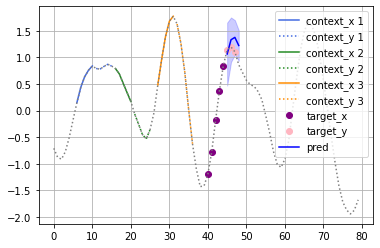

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 2, 1])
Iteration: 121000, loss: 2.33079195022583
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

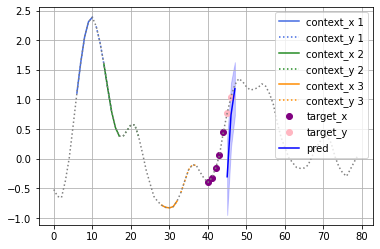

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 3, 1])
Iteration: 122000, loss: 8.706194877624512
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

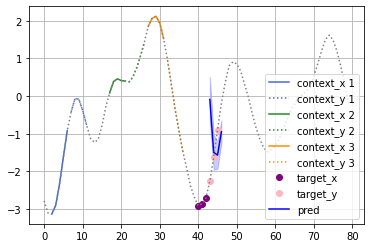

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 2, 1])
Iteration: 123000, loss: 1.9784038066864014
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

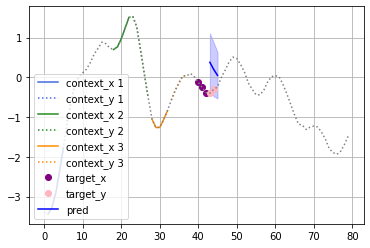

Update time per iter 0.05
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 3, 1])
Iteration: 124000, loss: 0.7644445300102234
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

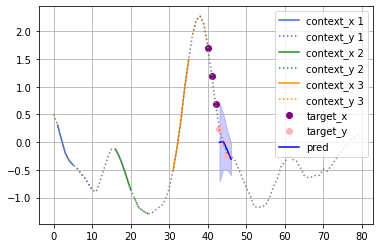

Update time per iter 0.05
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 5, 1])
Iteration: 125000, loss: 0.924536943435669
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

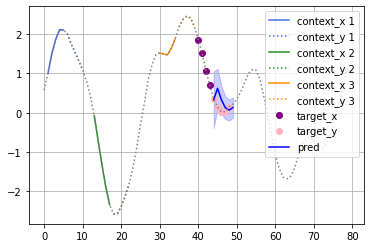

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 2, 1])
Iteration: 126000, loss: 0.6257695555686951
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

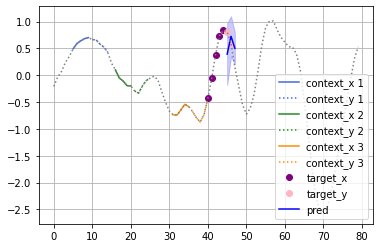

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 3, 1])
Iteration: 127000, loss: 1.2079042196273804
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

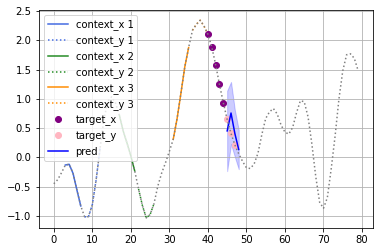

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 4, 1])
Iteration: 128000, loss: 0.7226839065551758
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

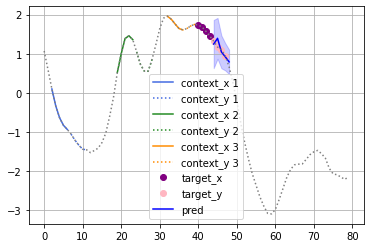

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 4, 1])
Iteration: 129000, loss: 1.1967920064926147
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

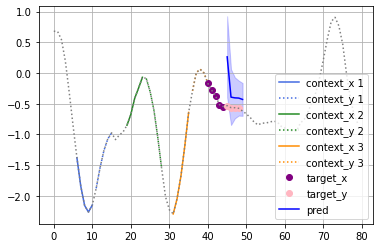

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 4, 1])
Iteration: 130000, loss: 1.265660285949707
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

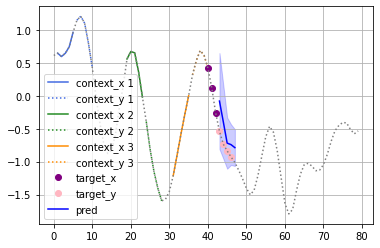

Update time per iter 0.05
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 3, 1])
Iteration: 131000, loss: 1.6122291088104248
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

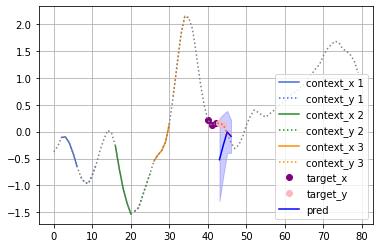

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 4, 1])
Iteration: 132000, loss: 0.3230578303337097
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

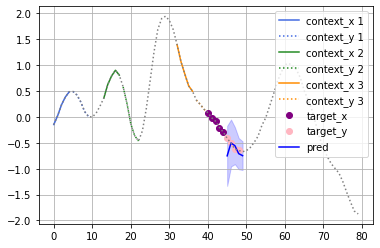

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 3, 1])
Iteration: 133000, loss: 6.291530132293701
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

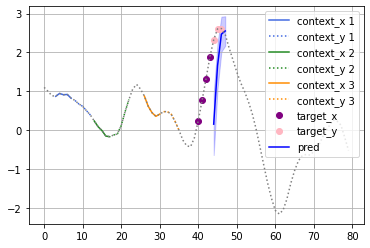

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 2, 1])
Iteration: 134000, loss: 2.3357396125793457
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

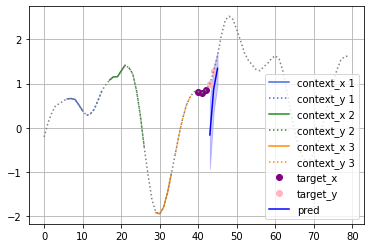

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 2, 1])
Iteration: 135000, loss: 0.8579919934272766
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

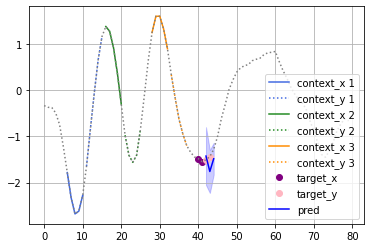

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 5, 1])
Iteration: 136000, loss: 1.0680779218673706
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

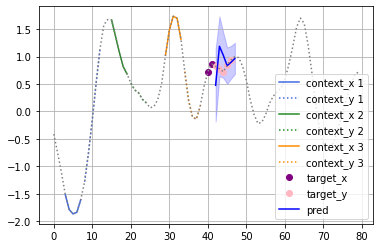

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 3, 1])
Iteration: 137000, loss: 4.070927619934082
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

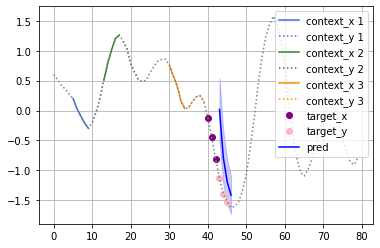

Update time per iter 0.05
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 3, 1])
Iteration: 138000, loss: 1.278428077697754
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

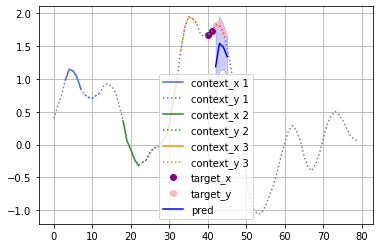

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 5, 1])
Iteration: 139000, loss: 0.8331543207168579
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

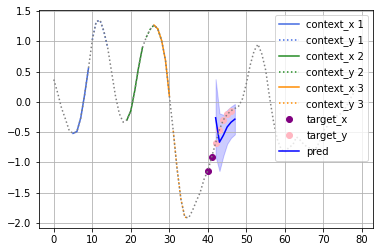

Update time per iter 0.05
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 2, 1])
Iteration: 140000, loss: 1.1367876529693604
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

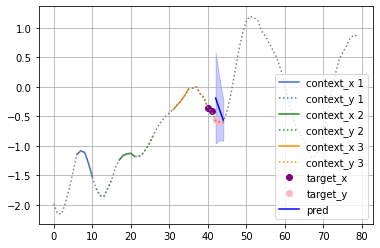

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 4, 1])
Iteration: 141000, loss: 14.612297058105469
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

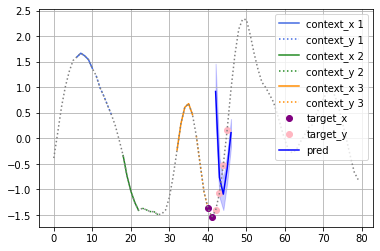

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 3, 1])
Iteration: 142000, loss: 5.032947540283203
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

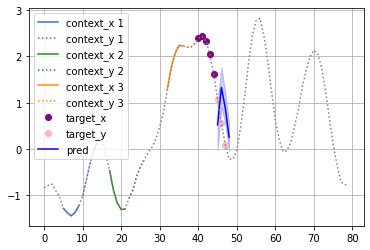

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 2, 1])
Iteration: 143000, loss: 1.0120409727096558
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

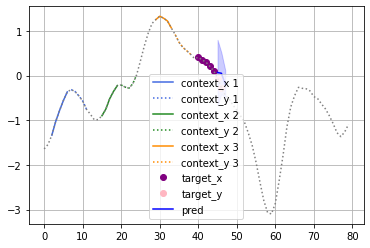

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 4, 1])
Iteration: 144000, loss: 0.6741672158241272
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

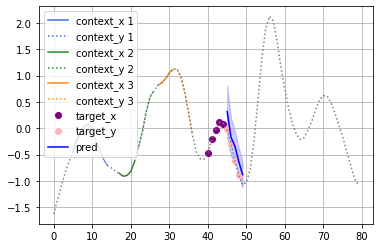

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 3, 1])
Iteration: 145000, loss: 0.5731987357139587
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

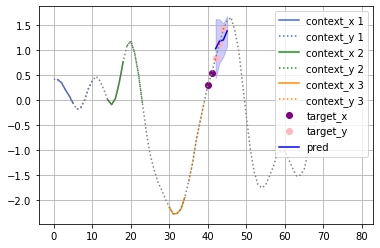

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 4, 1])
Iteration: 146000, loss: 3.26420259475708
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

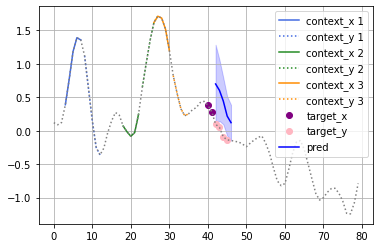

Update time per iter 0.05
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 3, 1])
Iteration: 147000, loss: 2.53904128074646
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

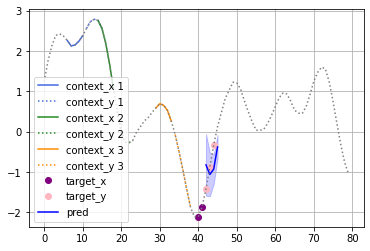

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 2, 1])
Iteration: 148000, loss: 0.7394809126853943
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

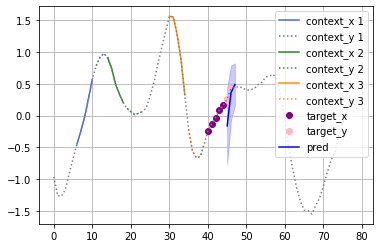

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 3, 1])
Iteration: 149000, loss: 1.2245477437973022
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

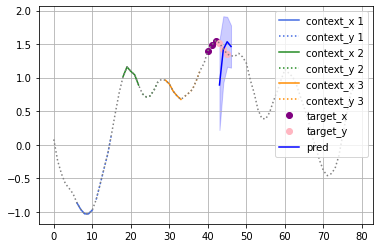

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 5, 1])
Iteration: 150000, loss: 3.3879811763763428
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

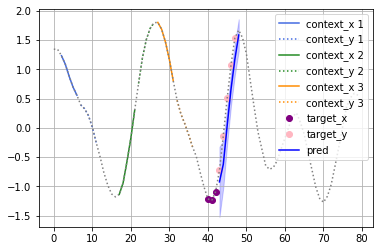

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 4, 1])
Iteration: 151000, loss: 5.641084671020508
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

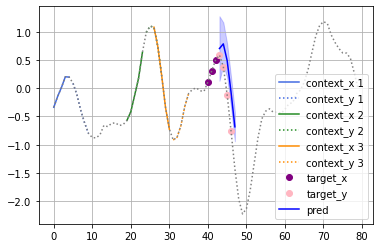

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 2, 1])
Iteration: 152000, loss: 0.7357704043388367
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

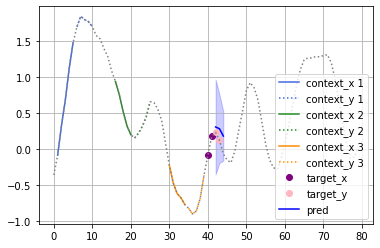

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 3, 1])
Iteration: 153000, loss: 2.784942626953125
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

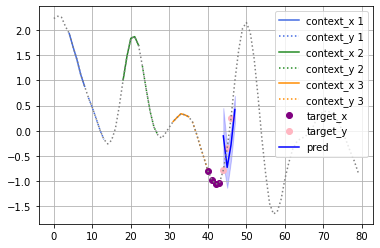

Update time per iter 0.05
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 3, 1])
Iteration: 154000, loss: 1.3726909160614014
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

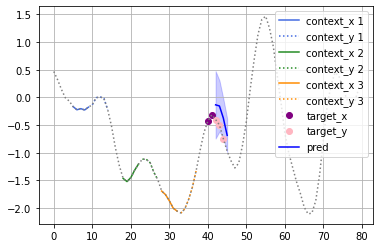

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 5, 1])
Iteration: 155000, loss: 2.5292587280273438
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

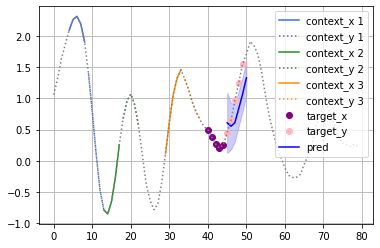

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 5, 1])
Iteration: 156000, loss: 1.214571237564087
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

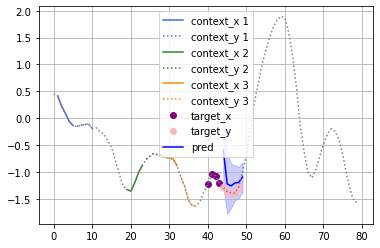

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 4, 1])
Iteration: 157000, loss: 0.737532913684845
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

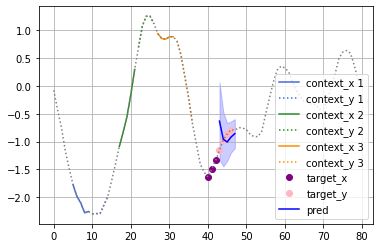

Update time per iter 0.05
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 4, 1])
Iteration: 158000, loss: 0.28789854049682617
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

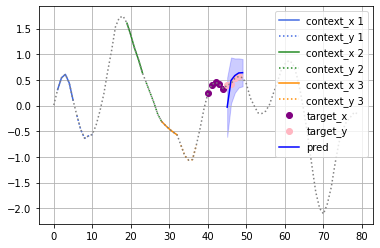

Update time per iter 0.05
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 3, 1])
Iteration: 159000, loss: 0.7502447366714478
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

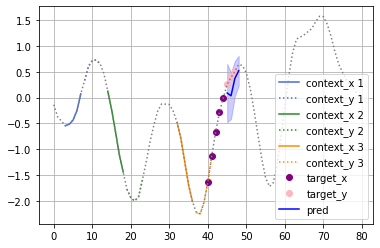

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 3, 1])
Iteration: 160000, loss: 0.4203752279281616
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

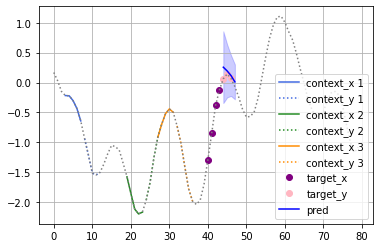

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 5, 1])
Iteration: 161000, loss: -0.45903557538986206
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

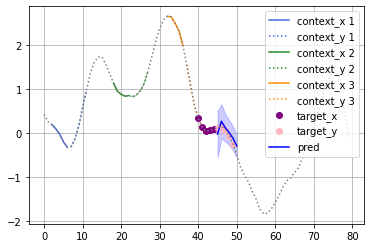

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 2, 1])
Iteration: 162000, loss: 0.8219738006591797
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

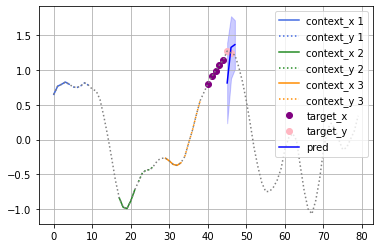

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 3, 1])
Iteration: 163000, loss: 1.217764139175415
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

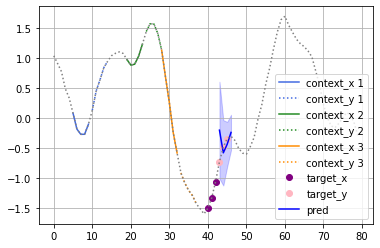

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 4, 1])
Iteration: 164000, loss: -0.42673224210739136
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

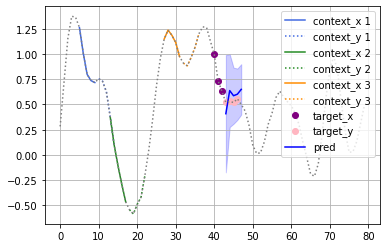

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 4, 1])
Iteration: 165000, loss: 1.7518259286880493
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

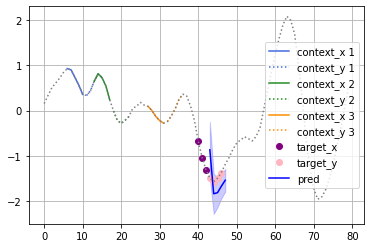

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 4, 1])
Iteration: 166000, loss: 0.03629797697067261
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

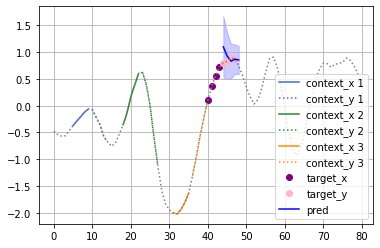

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 5, 1])
Iteration: 167000, loss: -0.0148048996925354
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

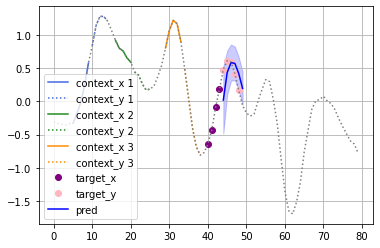

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 5, 1])
Iteration: 168000, loss: 2.5797622203826904
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

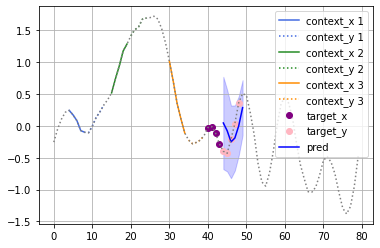

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 3, 1])
Iteration: 169000, loss: 1.727526307106018
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

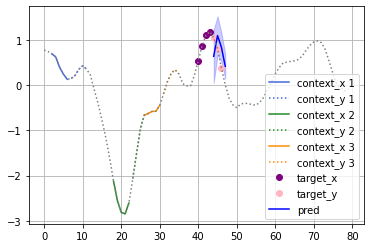

Update time per iter 0.05
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 4, 1])
Iteration: 170000, loss: -0.10652744770050049
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

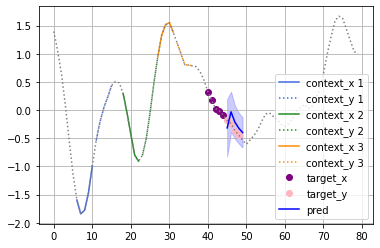

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 2, 1])
Iteration: 171000, loss: 3.6422946453094482
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

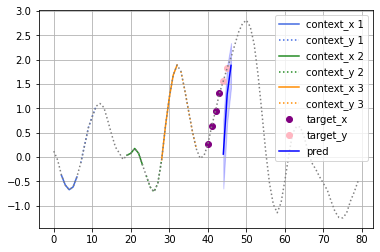

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 5, 1])
Iteration: 172000, loss: 0.30894553661346436
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

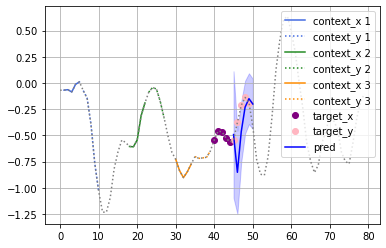

Update time per iter 0.05
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 4, 1])
Iteration: 173000, loss: 1.290184736251831
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

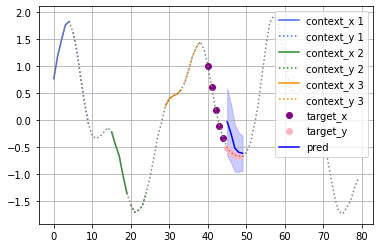

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 3, 1])
Iteration: 174000, loss: 0.54620361328125
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

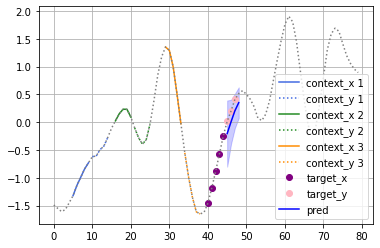

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 2, 1])
Iteration: 175000, loss: 0.9798505306243896
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

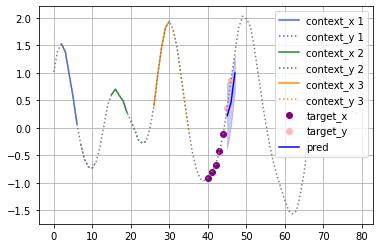

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 5, 1])
Iteration: 176000, loss: 0.6718529462814331
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

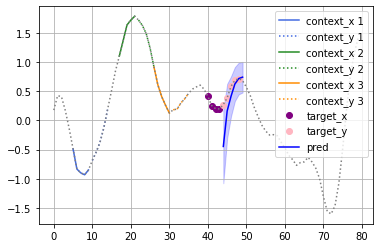

Update time per iter 0.05
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 3, 1])
Iteration: 177000, loss: 2.236443519592285
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

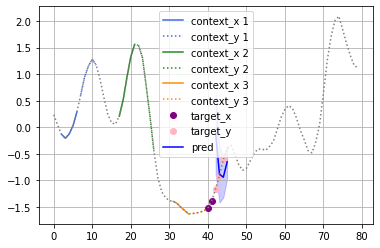

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 2, 1])
Iteration: 178000, loss: 1.1329811811447144
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

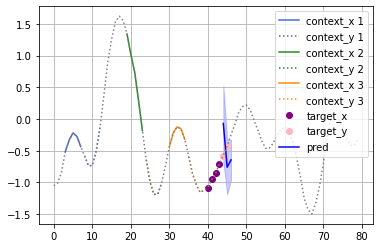

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 2, 1])
Iteration: 179000, loss: 3.3587656021118164
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

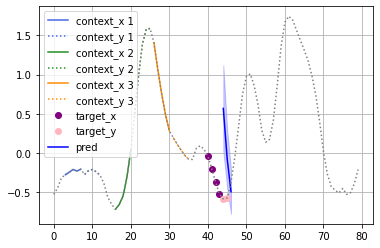

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 2, 1])
Iteration: 180000, loss: 1.0289205312728882
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

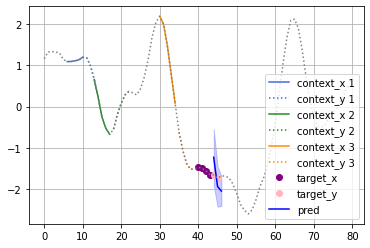

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 4, 1])
Iteration: 181000, loss: 0.25152015686035156
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

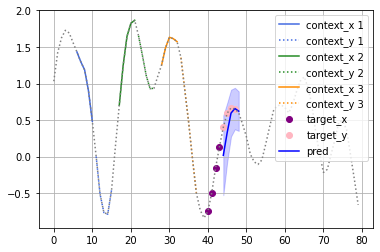

Update time per iter 0.05
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 3, 1])
Iteration: 182000, loss: 4.113926887512207
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

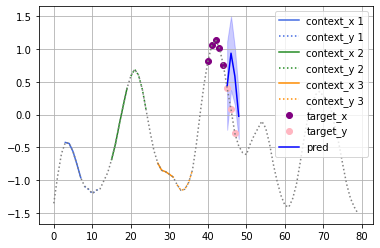

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 3, 1])
Iteration: 183000, loss: 1.2480499744415283
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

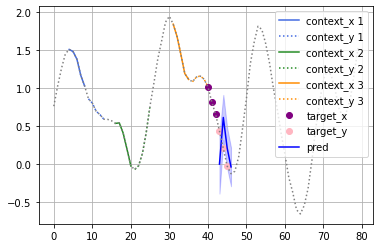

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 4, 1])
Iteration: 184000, loss: 0.5002751350402832
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

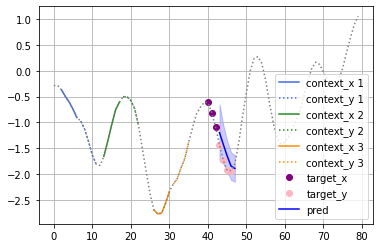

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 3, 1])
Iteration: 185000, loss: 0.5180359482765198
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

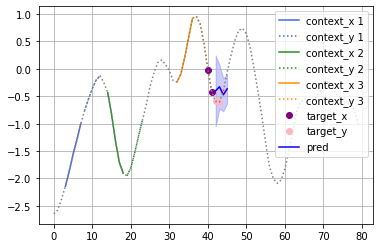

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 2, 1])
Iteration: 186000, loss: 0.7528663873672485
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

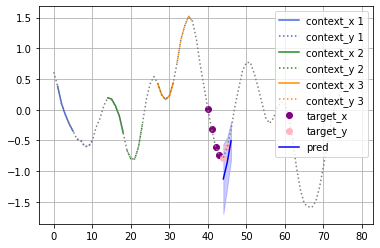

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 2, 1])
Iteration: 187000, loss: 1.8048157691955566
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

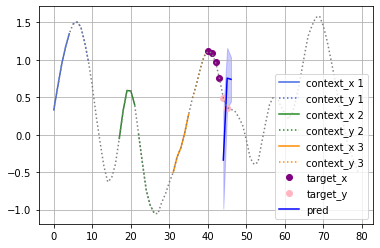

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 4, 1])
Iteration: 188000, loss: 4.159334182739258
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

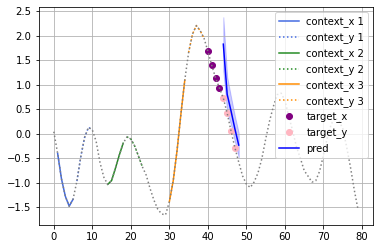

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 5, 1])
Iteration: 189000, loss: 3.7096683979034424
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

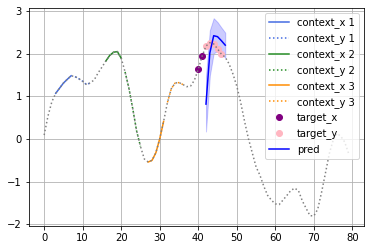

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 5, 1])
Iteration: 190000, loss: 3.779298782348633
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

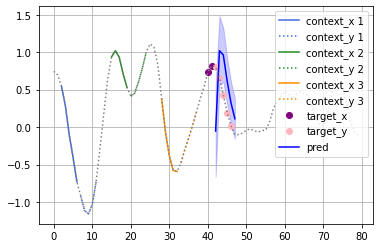

Update time per iter 0.05
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 4, 1])
Iteration: 191000, loss: 10.982215881347656
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

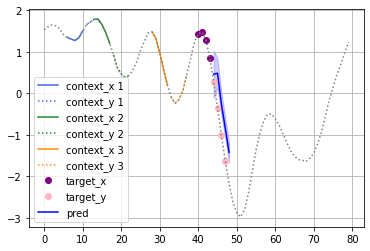

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 5, 1])
Iteration: 192000, loss: 13.067005157470703
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

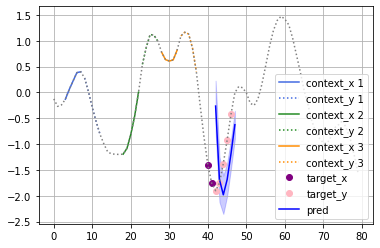

Update time per iter 0.05
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 5, 1])
Iteration: 193000, loss: 0.9318697452545166
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

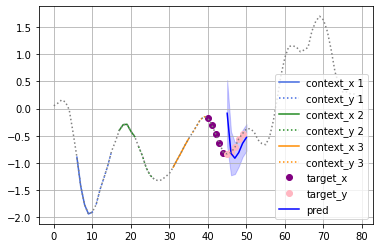

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 5, 1])
Iteration: 194000, loss: 7.139237403869629
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

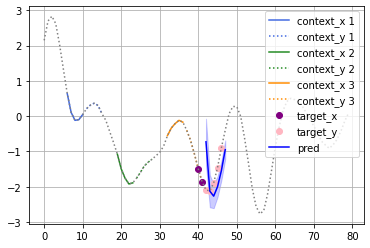

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 4, 1])
Iteration: 195000, loss: 3.357729911804199
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

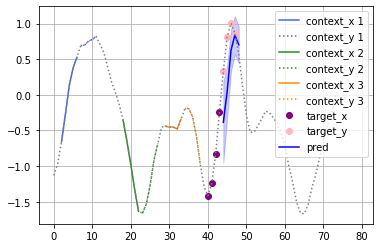

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 3, 1])
Iteration: 196000, loss: 3.980214834213257
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

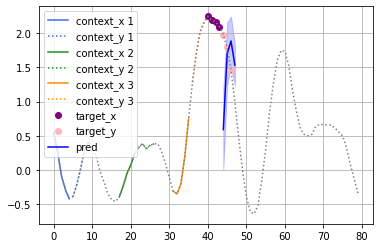

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 5, 1])
Iteration: 197000, loss: 1.123517394065857
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

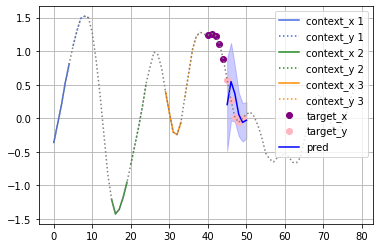

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 4, 1])
Iteration: 198000, loss: 0.7498056888580322
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

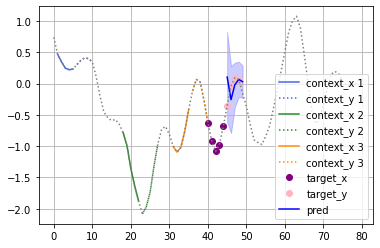

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 3, 1])
Iteration: 199000, loss: 0.6412405967712402
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_3749114/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

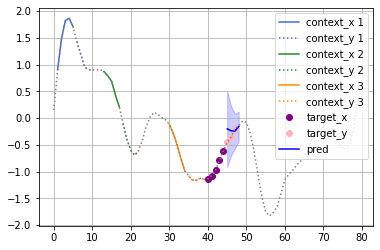

In [4]:
TRAINING_ITERATIONS = int(2e5)
PLOT_AFTER = int(1e3)
num_context = 3
len_context = 6
batch_size = 100
# The final output layer of the decoder outputs two values, one for the mean and
# one for the variance of the prediction at the target location
encoder_output_sizes = [64, 64]
decoder_output_sizes = [64, 64]
embedding_dim = 64

# Define the model
encoder_input_size = 1 + 1 # x and y pairs are encoder into the context
decoder_input_size = 64 + 1 + 1 # target is concatenated onto the representation as input into the decoder
model = ANP_RNN_Model(x_dim=1,
                      y_dim=1,
                      encoder_rnn_hidden_size_list=encoder_output_sizes,
                      decoder_rnn_hidden_size_list=decoder_output_sizes,
                      embedding_dim=embedding_dim,
                      context_concat='append',
                      )

model = model.to(device)

# Set up the optimizer and train step
optimizer = torch.optim.Adam(model.parameters(), lr=1e-5)

timings = collections.deque(maxlen=10)
losses = []

for it in range(TRAINING_ITERATIONS):
    start_time = time.time()
    
    # Train dataset
    dataset_train = GPSeqCurvesReader(batch_size=batch_size, 
                                      num_contexts=num_context,
                                      len_context_x=len_context,
                                      len_context_y=len_context,
                                      len_target_x=len_context,
                                      len_target_y=len_context,
                                      testing=False)
    data_train = dataset_train.generate_curves()

    # Test dataset
    dataset_test = GPSeqCurvesReader(batch_size=1,
                                     num_contexts=num_context,
                                     len_context_x=len_context,
                                     len_context_y=len_context,
                                     len_target_x=len_context,
                                     len_target_y=len_context,
                                     testing=False)
    data_test = dataset_test.generate_curves()
    
    (context_x, context_y), target_x = data_train.query
    
    context_x = context_x.to(device)
    context_y = context_y.to(device)
    target_x  = target_x.to(device)
    target_y  = data_train.target_y.to(device)
    
    _, _, loss = model.forward(
            context_x,
            context_y,
            target_x,
            target_y,
        )
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    
    timings.append(time.time() - start_time)

    # Plot the predictions in `PLOT_AFTER` intervals
    if it % PLOT_AFTER == 0:
        
        print("Update time per iter {:.2f}".format(np.mean(timings)))
        
        (context_x, context_y), target_x = data_test.query
        context_x = context_x.to(device)
        context_y = context_y.to(device)
        target_x  = target_x.to(device)
        target_y  = data_test.target_y.to(device)
        
        # Get the predicted mean and variance at the target points for the testing set
        print("Context x: {}".format(context_x.shape))
        print("Context y: {}".format(context_y.shape))
        print("target x: {}".format(target_x.shape))
        print("target y: {}".format(target_y.shape))
        pred_y, var, loss = model.forward(
            context_x,
            context_y,
            target_x,
            target_y)
        test_loss = loss.detach().item()
        losses.append(loss)
        print('Iteration: {}, loss: {}'.format(it, test_loss))
        print("pred_y: {}".format(pred_y.shape))
        # Plot the prediction and the context
        plot_functions(
            num_context,
            data_test.left_intervals,
            data_test.len_seqs,
            data_test.full,
            target_x.cpu().numpy(),
            target_y.cpu().numpy(),
            context_x.cpu().numpy(),
            context_y.cpu().numpy(),
            pred_y.cpu().numpy(),
            var.cpu().numpy(),
        )

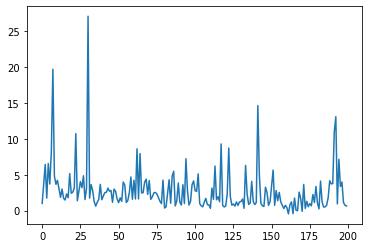

In [5]:
plt.plot([l.cpu().detach().numpy() for l in losses])
plt.show()

# X attention

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 5, 1])
Iteration: 0, loss: 4.066644668579102
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

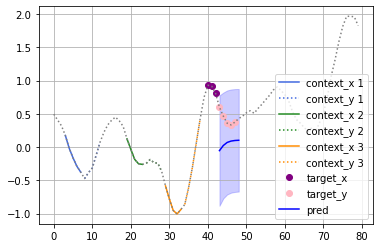

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 3, 1])
Iteration: 1000, loss: 2.4771127700805664
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

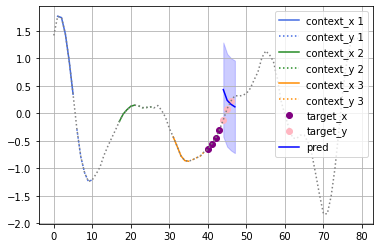

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 5, 1])
Iteration: 2000, loss: 3.8124144077301025
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

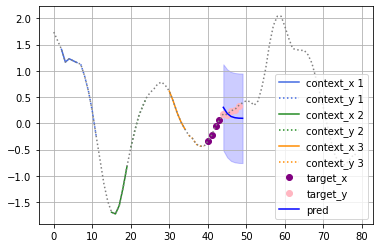

Update time per iter 0.05
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 5, 1])
Iteration: 3000, loss: 6.793564796447754
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

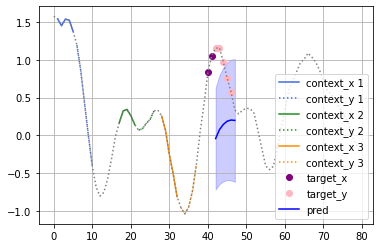

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 4, 1])
Iteration: 4000, loss: 13.2913236618042
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

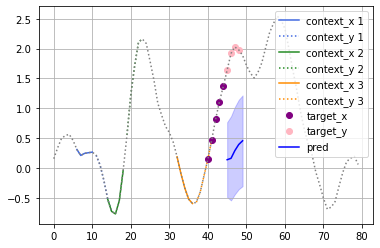

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 3, 1])
Iteration: 5000, loss: 4.060697078704834
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

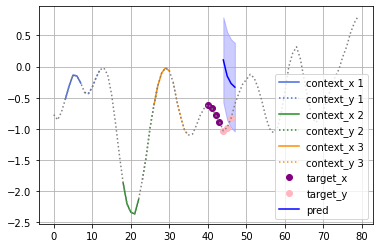

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 3, 1])
Iteration: 6000, loss: 4.018834114074707
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

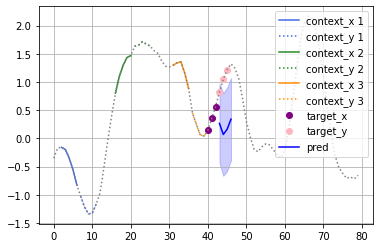

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 3, 1])
Iteration: 7000, loss: 3.366427421569824
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

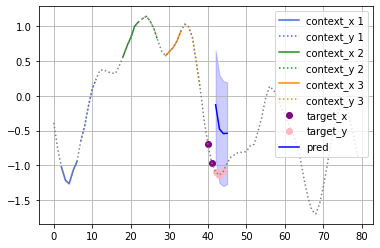

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 4, 1])
Iteration: 8000, loss: 4.594566345214844
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

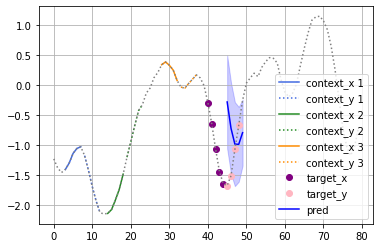

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 2, 1])
Iteration: 9000, loss: 4.0379557609558105
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

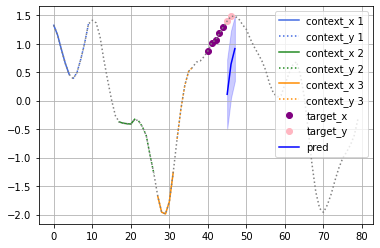

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 4, 1])
Iteration: 10000, loss: 5.921292781829834
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

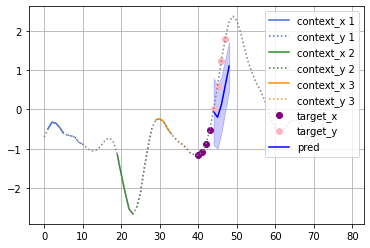

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 2, 1])
Iteration: 11000, loss: 0.8705607056617737
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

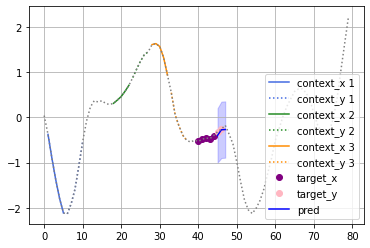

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 5, 1])
Iteration: 12000, loss: 2.289278268814087
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

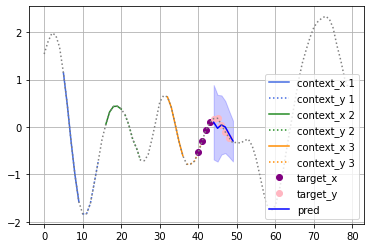

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 4, 1])
Iteration: 13000, loss: 2.4316916465759277
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

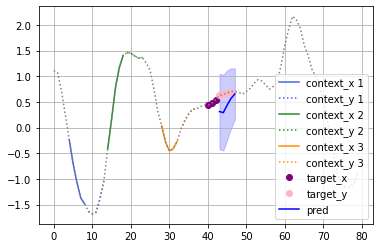

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 2, 1])
Iteration: 14000, loss: 1.3552367687225342
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

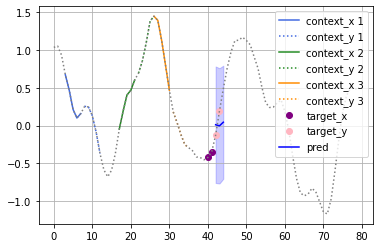

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 3, 1])
Iteration: 15000, loss: 1.5082496404647827
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

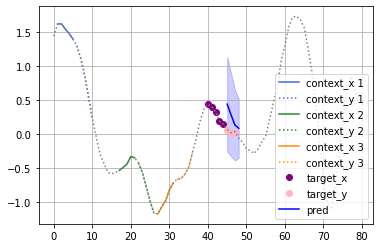

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 3, 1])
Iteration: 16000, loss: 2.9025702476501465
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

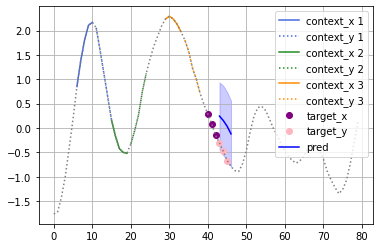

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 2, 1])
Iteration: 17000, loss: 1.5727746486663818
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

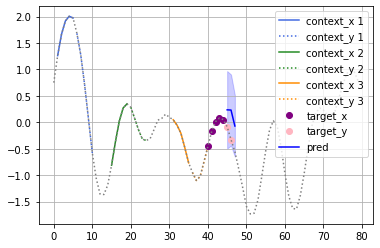

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 4, 1])
Iteration: 18000, loss: 5.825135231018066
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

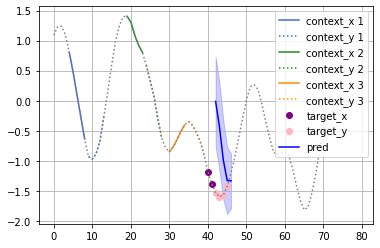

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 3, 1])
Iteration: 19000, loss: 1.9983049631118774
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

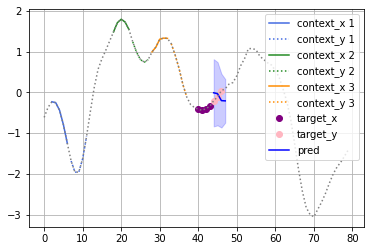

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 2, 1])
Iteration: 20000, loss: 2.5837302207946777
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

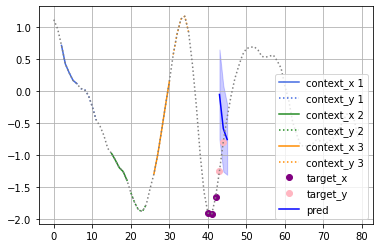

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 2, 1])
Iteration: 21000, loss: 1.451643705368042
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

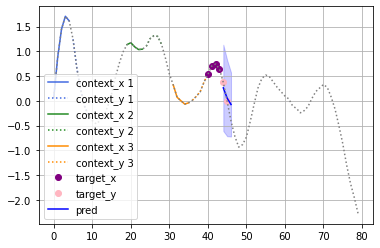

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 5, 1])
Iteration: 22000, loss: 3.206282138824463
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

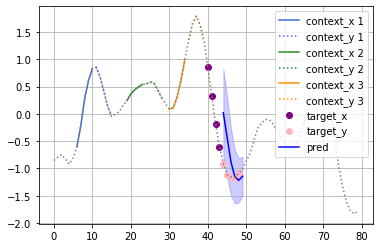

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 4, 1])
Iteration: 23000, loss: 3.79443097114563
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

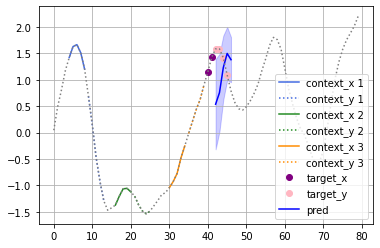

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 5, 1])
Iteration: 24000, loss: 3.968616247177124
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

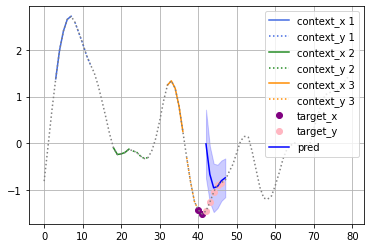

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 2, 1])
Iteration: 25000, loss: 1.22627854347229
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

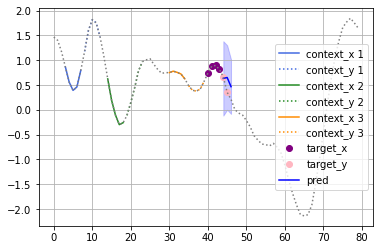

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 3, 1])
Iteration: 26000, loss: 2.4608163833618164
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

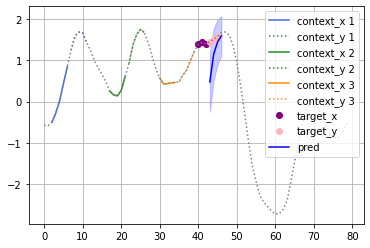

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 5, 1])
Iteration: 27000, loss: 3.7675764560699463
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

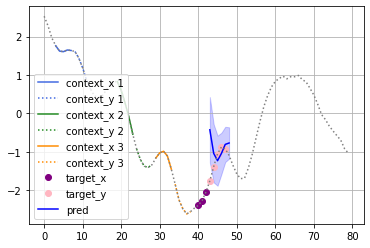

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 4, 1])
Iteration: 28000, loss: 4.096034049987793
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

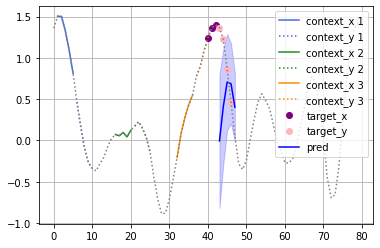

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 2, 1])
Iteration: 29000, loss: 0.71825110912323
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

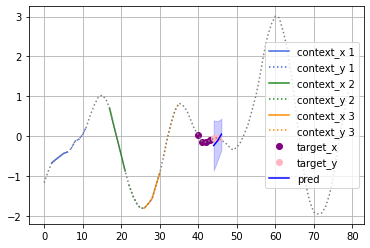

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 4, 1])
Iteration: 30000, loss: 5.561772346496582
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

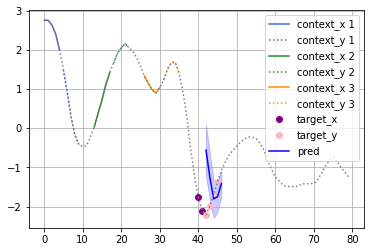

Update time per iter 0.11
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 2, 1])
Iteration: 31000, loss: 1.7966654300689697
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

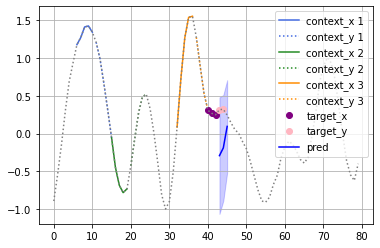

Update time per iter 0.14
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 3, 1])
Iteration: 32000, loss: 1.6515519618988037
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

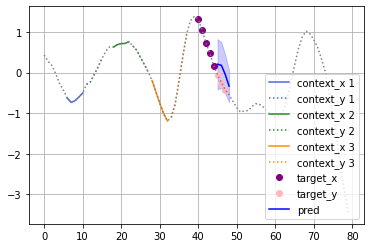

Update time per iter 0.13
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 3, 1])
Iteration: 33000, loss: 4.8780364990234375
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

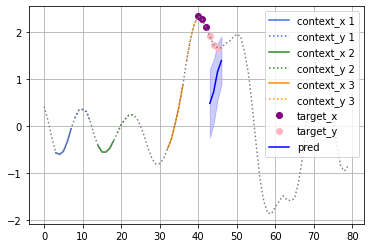

Update time per iter 0.10
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 3, 1])
Iteration: 34000, loss: 6.207712173461914
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

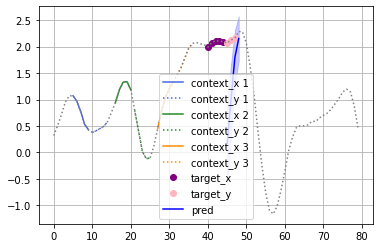

Update time per iter 0.13
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 3, 1])
Iteration: 35000, loss: 2.8190698623657227
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

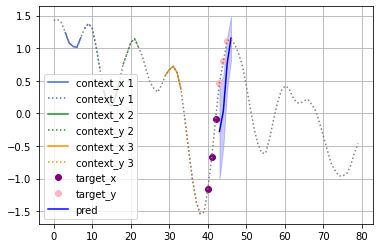

Update time per iter 0.13
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 3, 1])
Iteration: 36000, loss: 1.6339421272277832
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

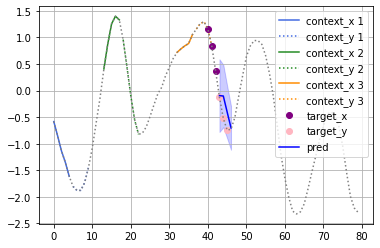

Update time per iter 0.10
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 3, 1])
Iteration: 37000, loss: 1.7232379913330078
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

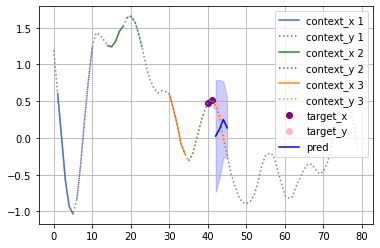

Update time per iter 0.15
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 3, 1])
Iteration: 38000, loss: 2.787278652191162
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

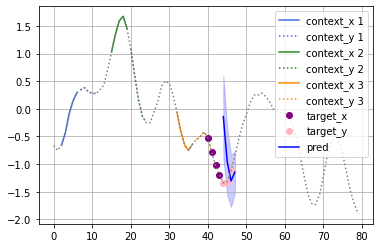

Update time per iter 0.14
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 5, 1])
Iteration: 39000, loss: 2.7277255058288574
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

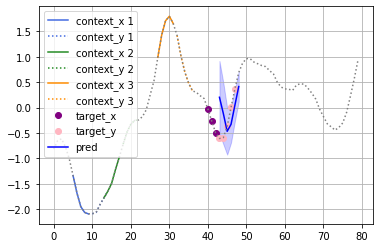

Update time per iter 0.10
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 2, 1])
Iteration: 40000, loss: 1.4812157154083252
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

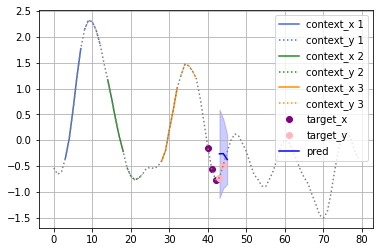

Update time per iter 0.13
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 3, 1])
Iteration: 41000, loss: 1.9683256149291992
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

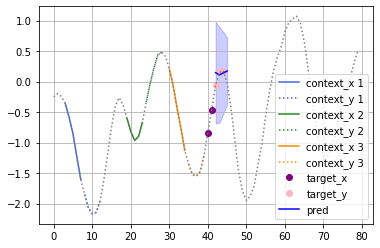

Update time per iter 0.13
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 5, 1])
Iteration: 42000, loss: 3.2413523197174072
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

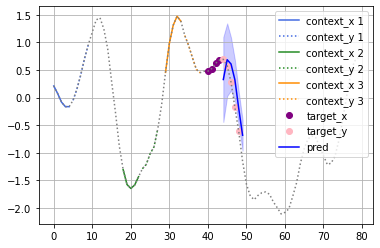

Update time per iter 0.10
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 4, 1])
Iteration: 43000, loss: 1.5583733320236206
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

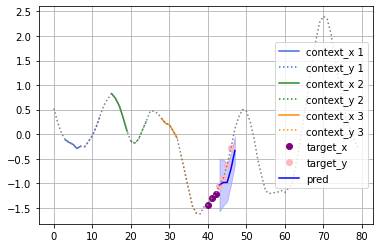

Update time per iter 0.14
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 4, 1])
Iteration: 44000, loss: 1.7684130668640137
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

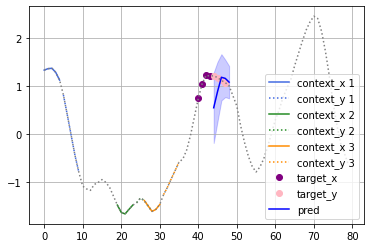

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 2, 1])
Iteration: 45000, loss: 1.7617034912109375
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

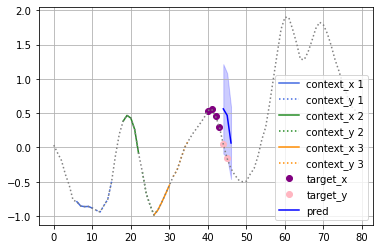

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 5, 1])
Iteration: 46000, loss: 8.251386642456055
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

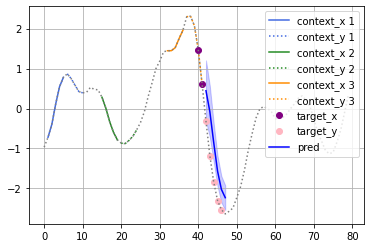

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 4, 1])
Iteration: 47000, loss: 1.8801957368850708
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

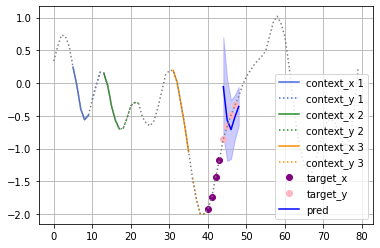

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 4, 1])
Iteration: 48000, loss: 2.566875696182251
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

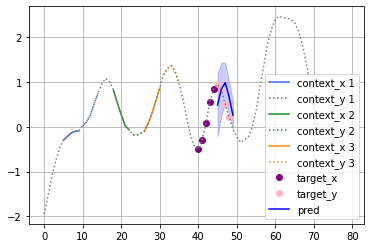

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 5, 1])
Iteration: 49000, loss: 1.4451559782028198
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

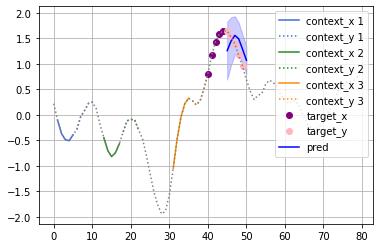

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 5, 1])
Iteration: 50000, loss: 4.88284158706665
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

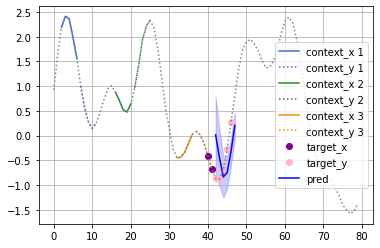

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 3, 1])
Iteration: 51000, loss: 5.066440582275391
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

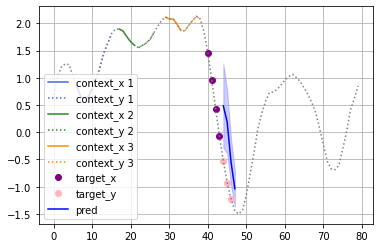

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 3, 1])
Iteration: 52000, loss: 1.2745344638824463
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

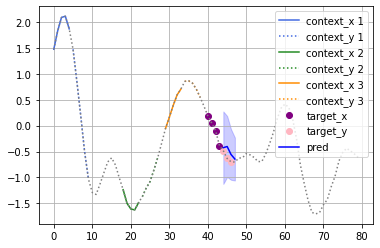

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 5, 1])
Iteration: 53000, loss: 4.479955196380615
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

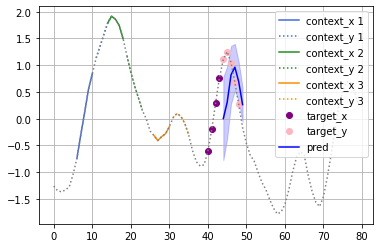

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 5, 1])
Iteration: 54000, loss: 0.5521813631057739
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

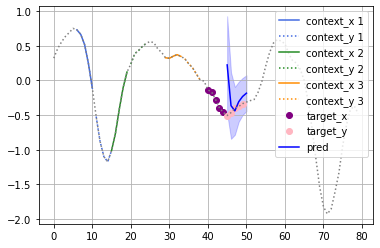

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 4, 1])
Iteration: 55000, loss: 1.0537104606628418
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

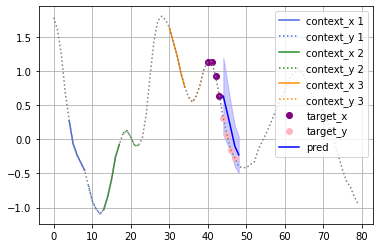

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 4, 1])
Iteration: 56000, loss: 2.6981217861175537
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

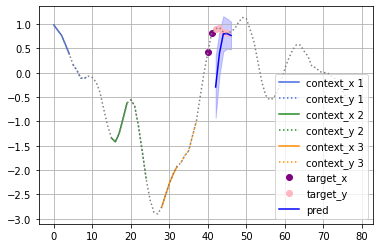

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 3, 1])
Iteration: 57000, loss: 2.0122265815734863
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

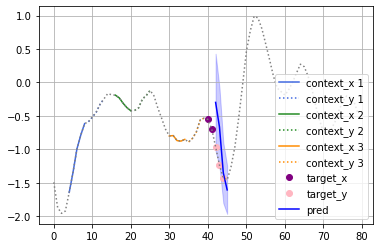

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 3, 1])
Iteration: 58000, loss: 2.3676836490631104
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

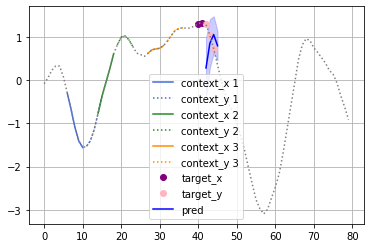

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 3, 1])
Iteration: 59000, loss: 0.9966323971748352
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

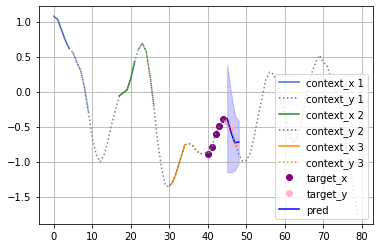

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 3, 1])
Iteration: 60000, loss: 2.2381012439727783
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

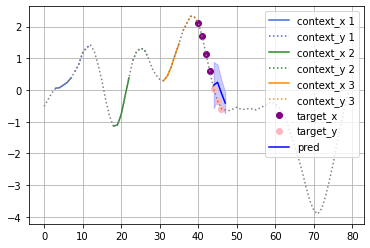

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 2, 1])
Iteration: 61000, loss: 1.6331274509429932
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

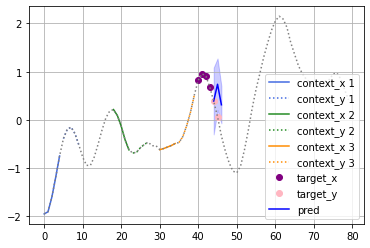

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 4, 1])
Iteration: 62000, loss: 0.8965471386909485
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

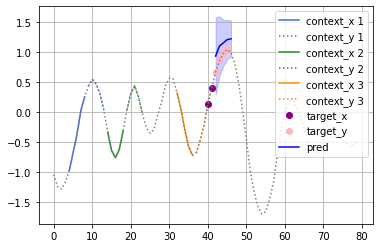

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 5, 1])
Iteration: 63000, loss: 1.743093729019165
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

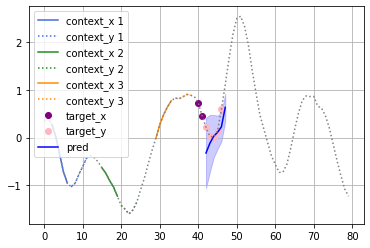

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 2, 1])
Iteration: 64000, loss: 1.8645334243774414
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

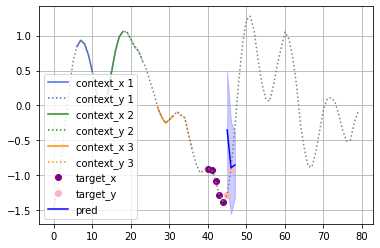

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 2, 1])
Iteration: 65000, loss: 0.9908202290534973
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

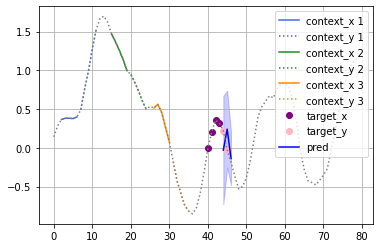

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 5, 1])
Iteration: 66000, loss: 2.52828311920166
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

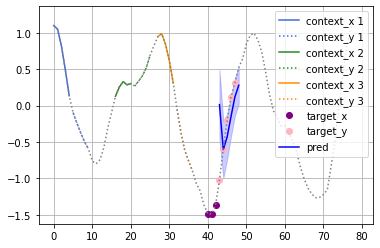

Update time per iter 0.05
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 2, 1])
Iteration: 67000, loss: 1.2422459125518799
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

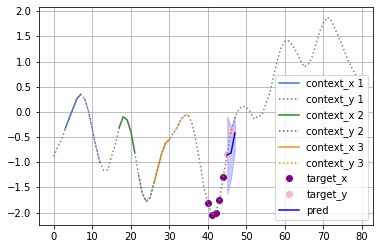

Update time per iter 0.06
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 3, 1])
Iteration: 68000, loss: 2.778536081314087
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

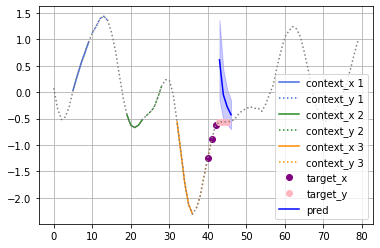

Update time per iter 0.05
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 2, 1])
Iteration: 69000, loss: 1.2677268981933594
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

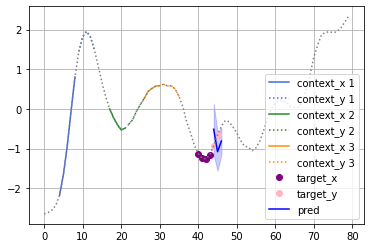

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 5, 1])
Iteration: 70000, loss: 1.3561999797821045
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

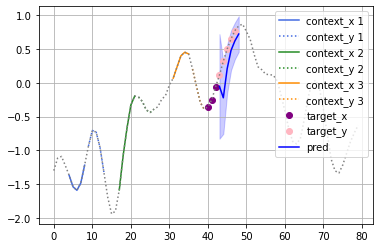

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 5, 1])
Iteration: 71000, loss: 4.210503578186035
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

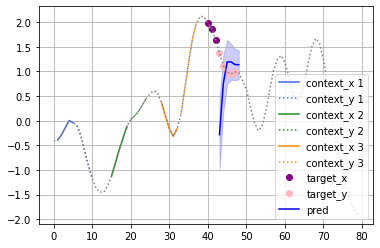

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 5, 1])
Iteration: 72000, loss: 2.87603759765625
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

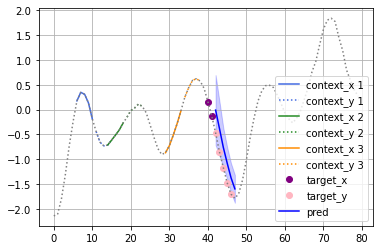

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 5, 1])
Iteration: 73000, loss: -0.4576236605644226
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

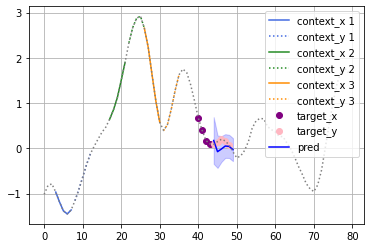

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 3, 1])
Iteration: 74000, loss: 0.02138131856918335
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

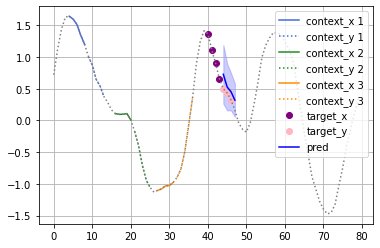

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 5, 1])
Iteration: 75000, loss: 1.2048590183258057
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

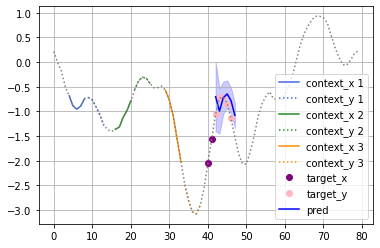

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 2, 1])
Iteration: 76000, loss: 8.968387603759766
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

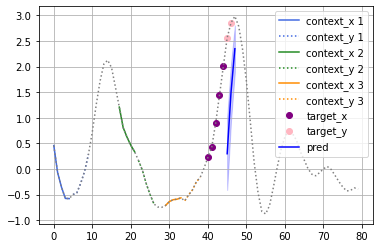

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 5, 1])
Iteration: 77000, loss: 0.41973477602005005
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

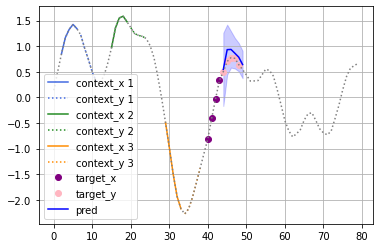

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 5, 1])
Iteration: 78000, loss: 1.4148190021514893
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

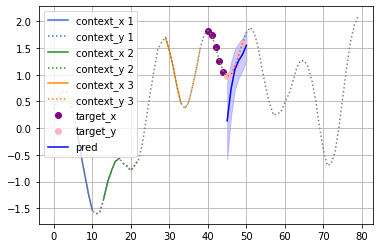

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 4, 1])
Iteration: 79000, loss: 1.507629632949829
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

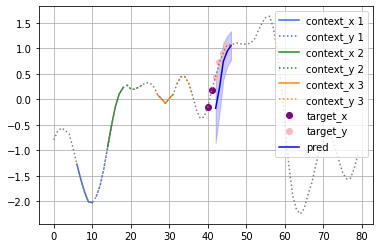

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 5, 1])
Iteration: 80000, loss: 1.4495468139648438
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

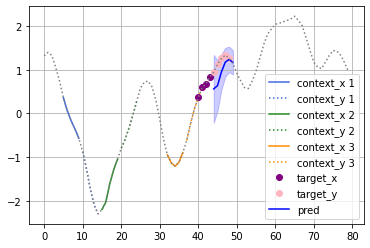

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 2, 1])
Iteration: 81000, loss: 2.4033377170562744
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

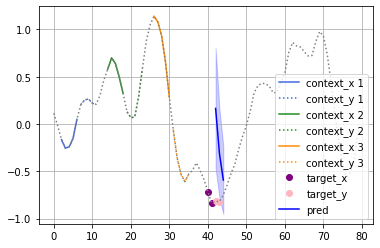

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 4, 1])
Iteration: 82000, loss: 1.927675485610962
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

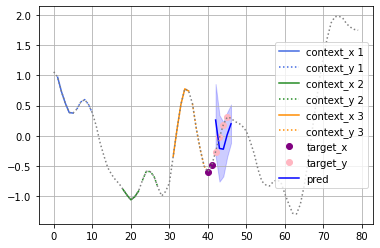

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 5, 1])
Iteration: 83000, loss: 3.872553586959839
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

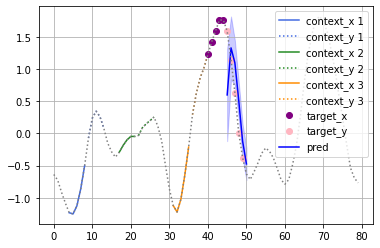

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 5, 1])
Iteration: 84000, loss: 3.923089027404785
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

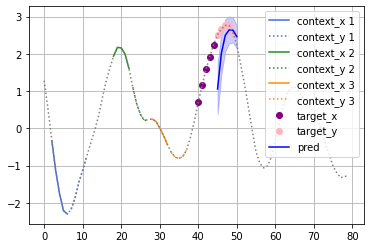

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 2, 1])
Iteration: 85000, loss: 1.2504189014434814
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

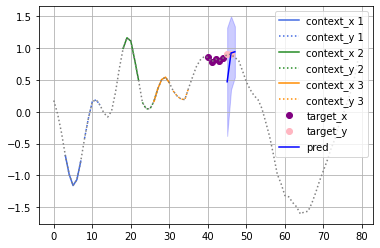

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 4, 1])
Iteration: 86000, loss: 0.6114016175270081
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

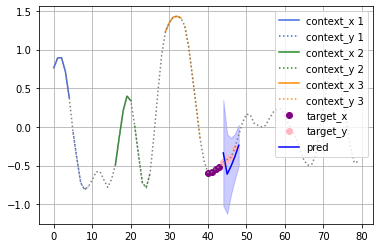

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 3, 1])
Iteration: 87000, loss: 0.6378194689750671
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

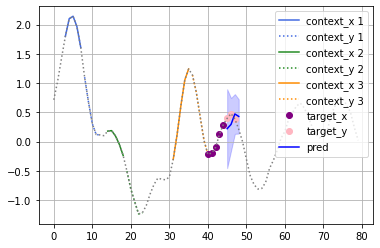

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 2, 1])
Iteration: 88000, loss: 2.376574993133545
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

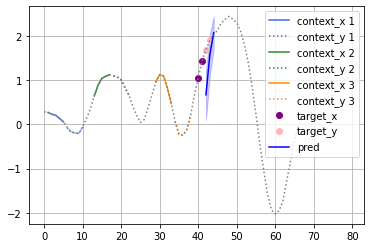

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 4, 1])
Iteration: 89000, loss: 1.2103359699249268
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

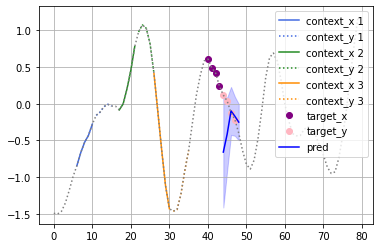

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 3, 1])
Iteration: 90000, loss: 0.7723842263221741
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

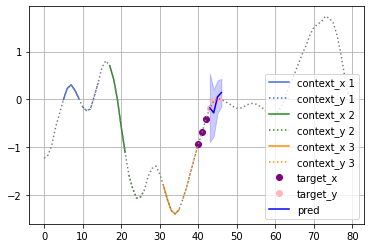

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 3, 1])
Iteration: 91000, loss: 1.086930274963379
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

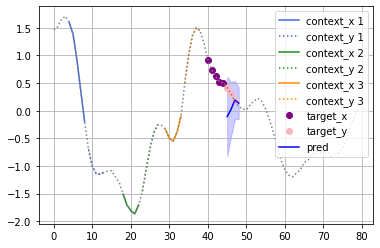

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 2, 1])
Iteration: 92000, loss: 1.6430550813674927
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

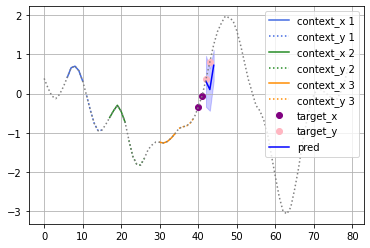

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 4, 1])
Iteration: 93000, loss: 2.3815932273864746
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

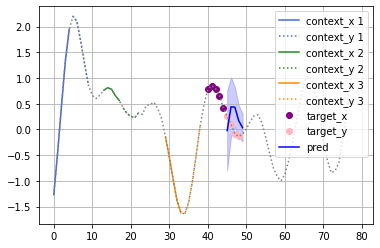

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 5, 1])
Iteration: 94000, loss: 1.4200208187103271
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

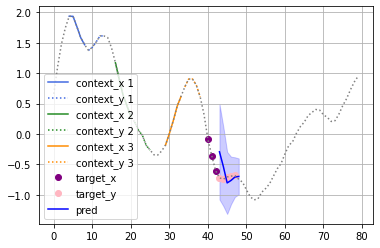

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 5, 1])
Iteration: 95000, loss: 0.09631294012069702
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

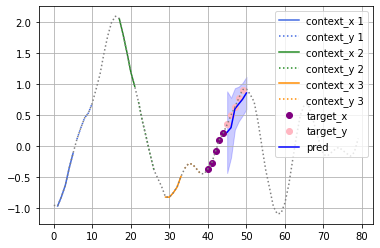

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 2, 1])
Iteration: 96000, loss: 3.5855166912078857
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

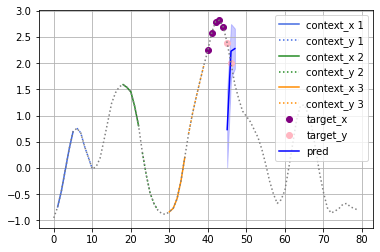

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 2, 1])
Iteration: 97000, loss: 1.2717859745025635
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

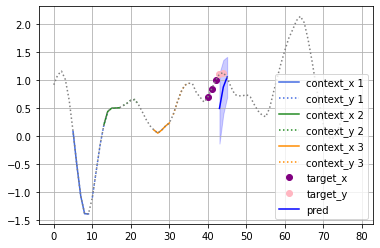

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 5, 1])
Iteration: 98000, loss: 1.4930959939956665
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

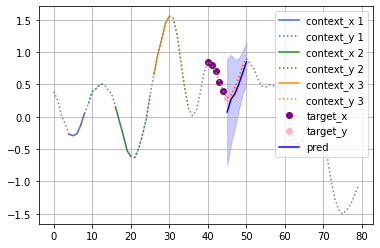

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 3, 1])
Iteration: 99000, loss: 1.629689335823059
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

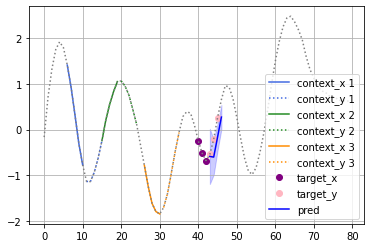

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 5, 1])
Iteration: 100000, loss: 1.348588228225708
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

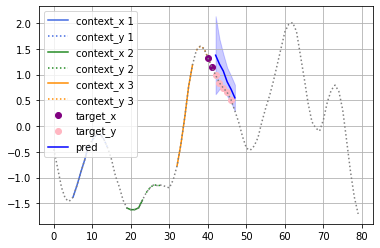

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 5, 1])
Iteration: 101000, loss: 0.8204482793807983
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

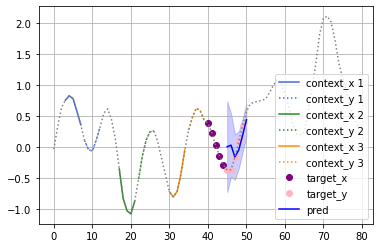

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 2, 1])
Iteration: 102000, loss: 7.82496452331543
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

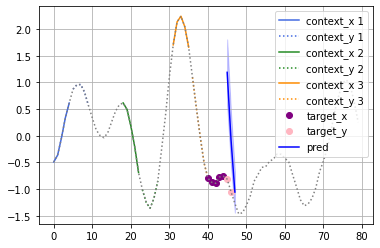

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 5, 1])
Iteration: 103000, loss: 0.6852055788040161
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

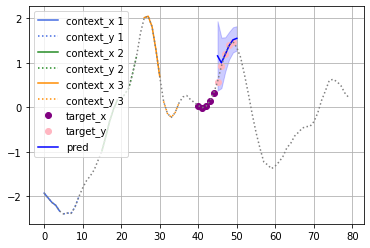

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 5, 1])
Iteration: 104000, loss: 7.558838367462158
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

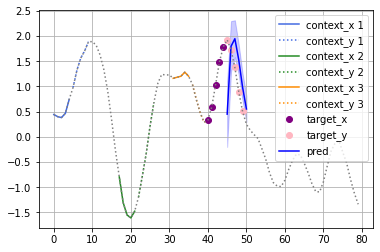

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 5, 1])
Iteration: 105000, loss: 1.2491273880004883
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

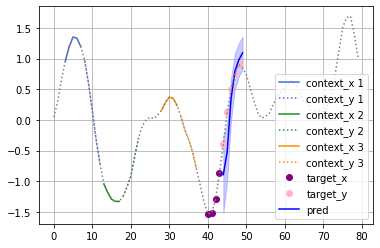

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 3, 1])
Iteration: 106000, loss: 1.5557544231414795
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

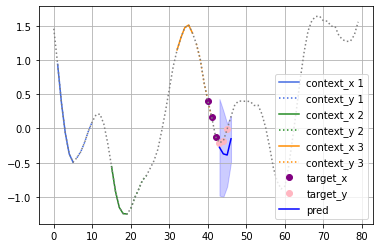

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 2, 1])
Iteration: 107000, loss: 1.1499791145324707
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

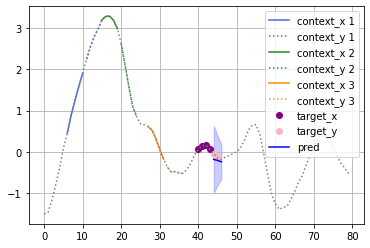

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 5, 1])
Iteration: 108000, loss: 5.704801559448242
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

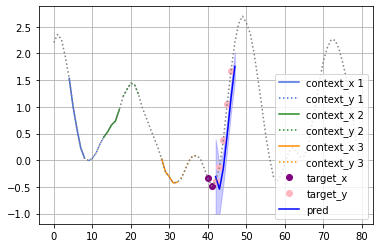

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 3, 1])
Iteration: 109000, loss: 1.1212328672409058
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

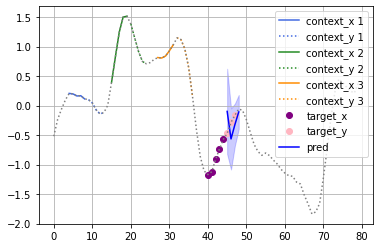

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 3, 1])
Iteration: 110000, loss: 1.378950595855713
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

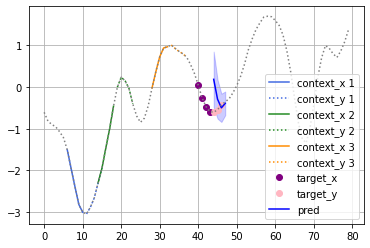

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 2, 1])
Iteration: 111000, loss: 1.273838996887207
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

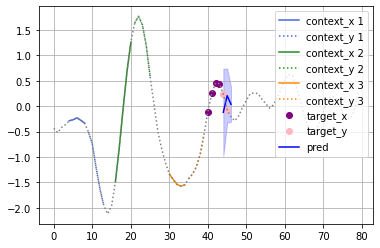

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 5, 1])
Iteration: 112000, loss: 0.9506288766860962
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

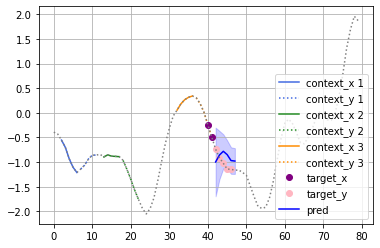

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 3, 1])
Iteration: 113000, loss: 1.5815505981445312
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

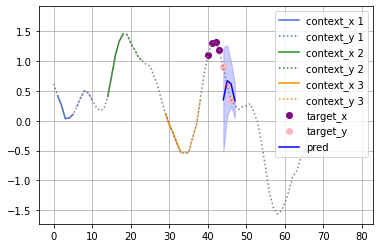

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 4, 1])
Iteration: 114000, loss: 0.7669099569320679
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

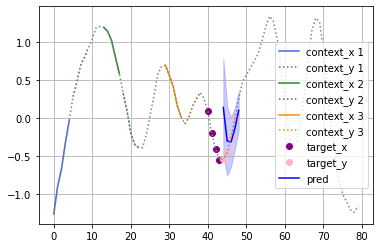

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 4, 1])
Iteration: 115000, loss: 0.26394397020339966
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

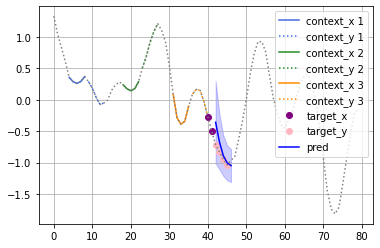

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 5, 1])
Iteration: 116000, loss: 6.198119163513184
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

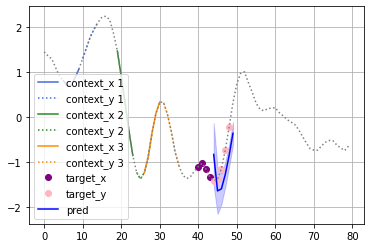

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 4, 1])
Iteration: 117000, loss: 0.47561895847320557
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

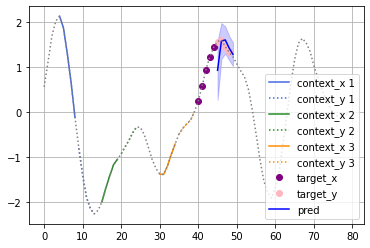

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 4, 1])
Iteration: 118000, loss: 0.17706912755966187
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

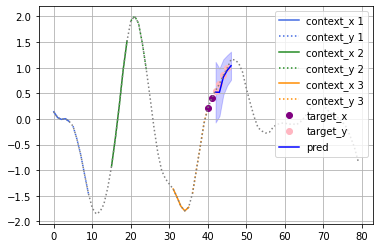

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 4, 1])
Iteration: 119000, loss: 2.3205158710479736
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

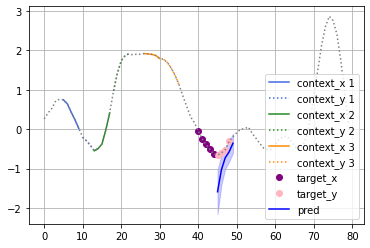

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 2, 1])
Iteration: 120000, loss: 1.0457807779312134
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

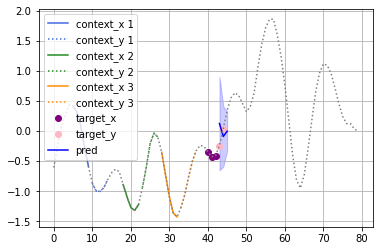

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 3, 1])
Iteration: 121000, loss: 8.265667915344238
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

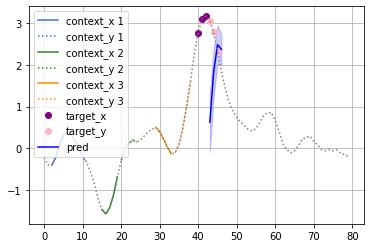

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 3, 1])
Iteration: 122000, loss: 2.245936870574951
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

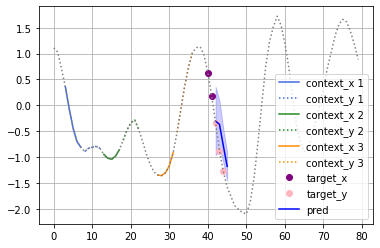

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 2, 1])
Iteration: 123000, loss: 1.4339635372161865
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

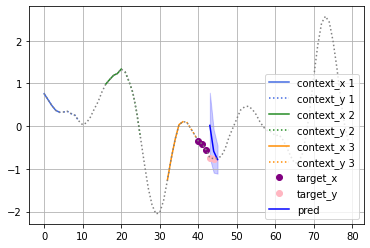

Update time per iter 0.10
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 4, 1])
Iteration: 124000, loss: 1.4519762992858887
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

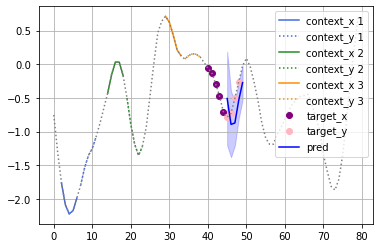

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 5, 1])
Iteration: 125000, loss: 2.868551731109619
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

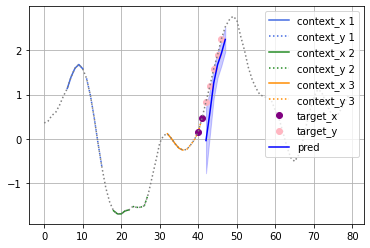

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 4, 1])
Iteration: 126000, loss: 2.3232598304748535
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

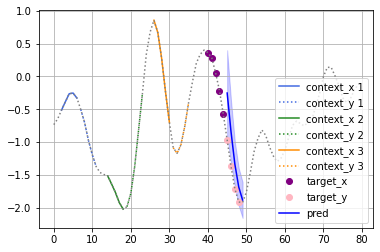

Update time per iter 0.10
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 4, 1])
Iteration: 127000, loss: 2.328372001647949
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

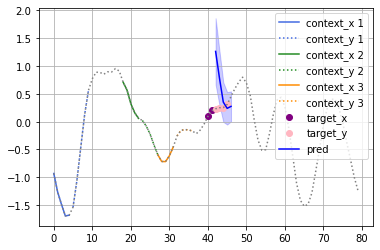

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 5, 1])
Iteration: 128000, loss: 0.06355845928192139
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

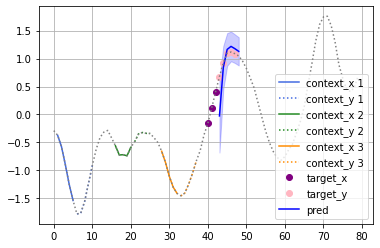

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 3, 1])
Iteration: 129000, loss: 3.7653164863586426
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

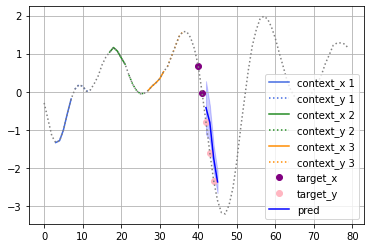

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 3, 1])
Iteration: 130000, loss: 2.584225654602051
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

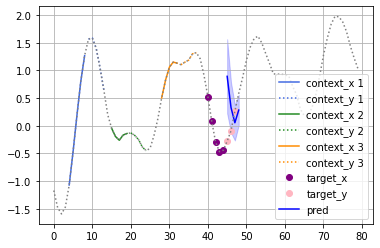

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 5, 1])
Iteration: 131000, loss: 2.739933490753174
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

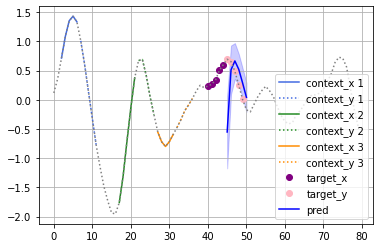

Update time per iter 0.10
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 4, 1])
Iteration: 132000, loss: 0.6270660161972046
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

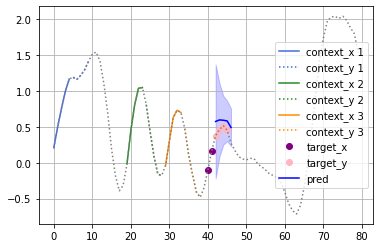

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 3, 1])
Iteration: 133000, loss: 1.2089797258377075
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

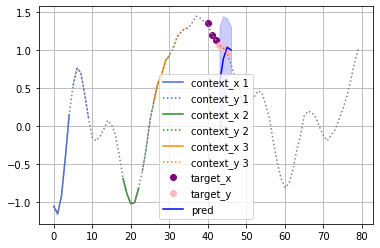

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 3, 1])
Iteration: 134000, loss: 1.3229167461395264
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

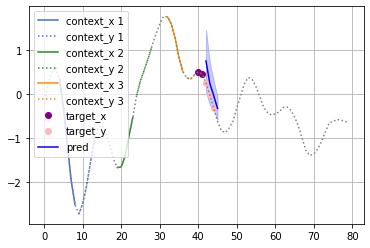

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 5, 1])
Iteration: 135000, loss: 1.5608388185501099
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

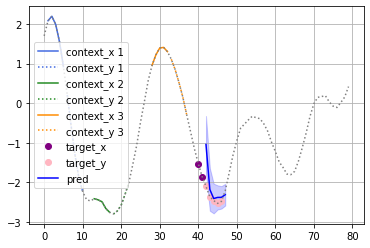

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 2, 1])
Iteration: 136000, loss: 1.2382183074951172
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

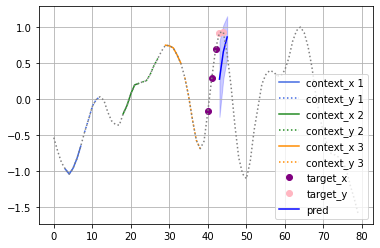

Update time per iter 0.10
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 4, 1])
Iteration: 137000, loss: 2.30444598197937
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

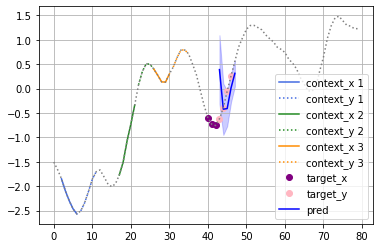

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 4, 1])
Iteration: 138000, loss: 0.10991579294204712
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

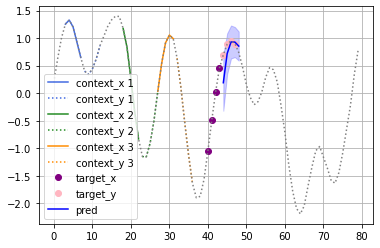

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 4, 1])
Iteration: 139000, loss: 0.3999306559562683
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

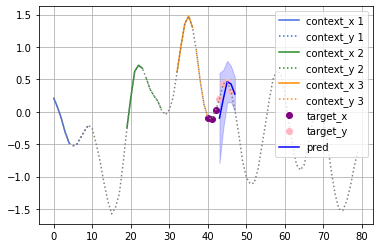

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 4, 1])
Iteration: 140000, loss: 1.6054273843765259
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

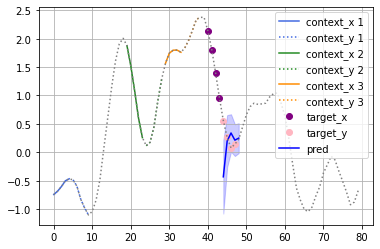

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 5, 1])
Iteration: 141000, loss: 3.6112773418426514
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

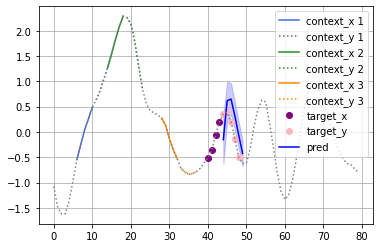

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 3, 1])
Iteration: 142000, loss: 1.5710246562957764
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

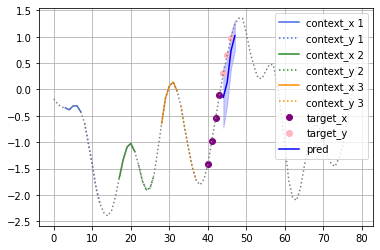

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 5, 1])
Iteration: 143000, loss: 0.7310166358947754
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

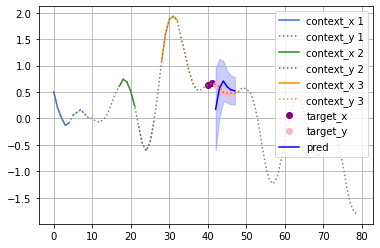

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 3, 1])
Iteration: 144000, loss: 1.2457196712493896
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

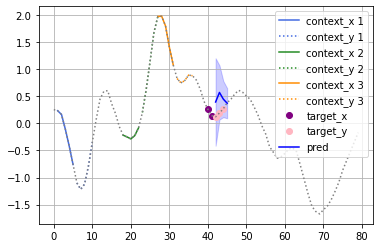

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 3, 1])
Iteration: 145000, loss: 2.7628679275512695
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

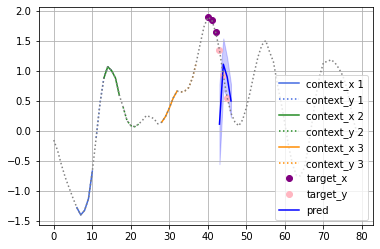

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 4, 1])
Iteration: 146000, loss: 3.965141534805298
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

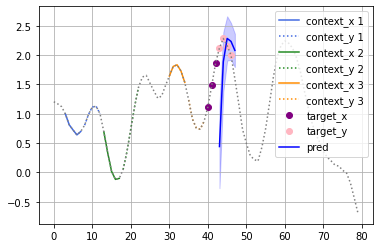

Update time per iter 0.10
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 4, 1])
Iteration: 147000, loss: 4.339479446411133
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

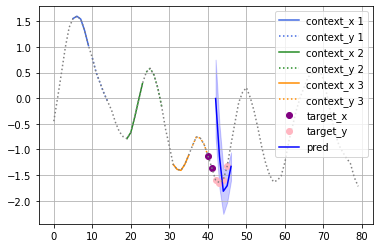

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 2, 1])
Iteration: 148000, loss: 0.7457625269889832
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

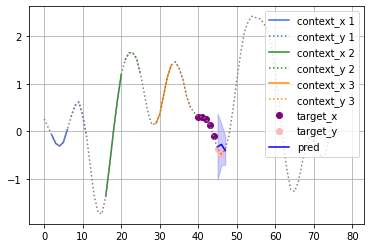

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 3, 1])
Iteration: 149000, loss: 1.42099928855896
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

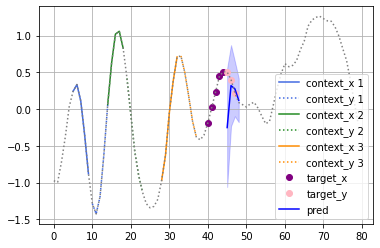

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 4, 1])
Iteration: 150000, loss: 1.752359390258789
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

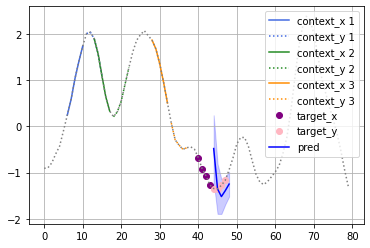

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 4, 1])
Iteration: 151000, loss: -9.465217590332031e-05
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

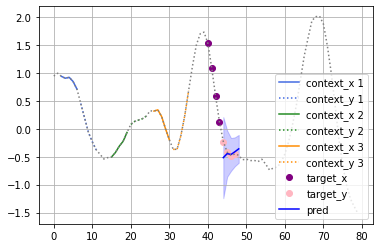

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 5, 1])
Iteration: 152000, loss: 1.5730018615722656
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

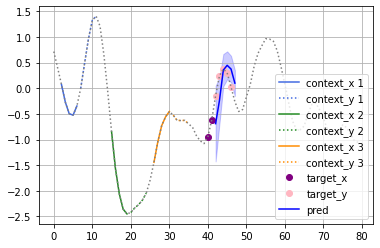

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 5, 1])
Iteration: 153000, loss: 1.3647596836090088
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

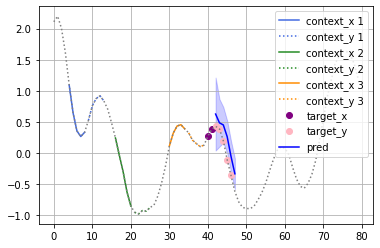

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 2, 1])
Iteration: 154000, loss: 0.8128890991210938
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

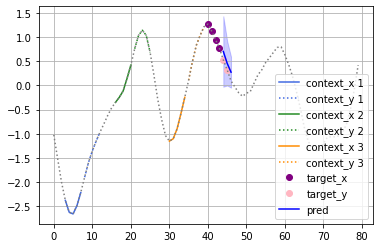

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 2, 1])
Iteration: 155000, loss: 2.9166572093963623
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

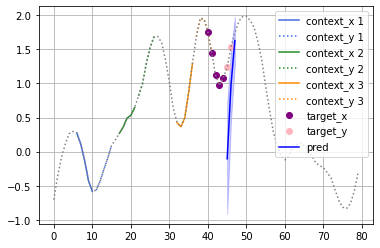

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 2, 1])
Iteration: 156000, loss: 1.5205496549606323
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

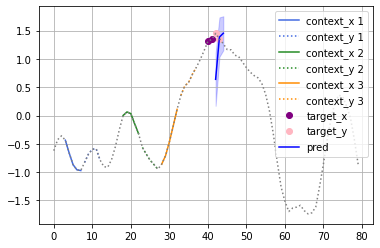

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 3, 1])
Iteration: 157000, loss: 1.6219117641448975
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

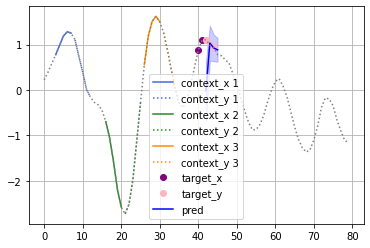

Update time per iter 0.35
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 3, 1])
Iteration: 158000, loss: 1.6785062551498413
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

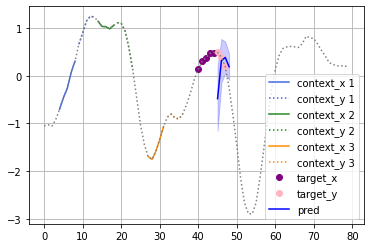

Update time per iter 0.35
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 5, 1])
Iteration: 159000, loss: 1.0055707693099976
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

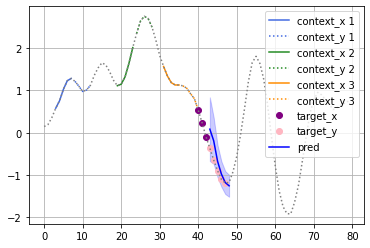

Update time per iter 0.34
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 5, 1])
Iteration: 160000, loss: 3.6321768760681152
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

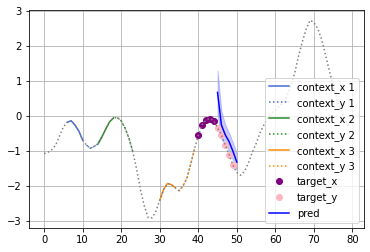

Update time per iter 0.16
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 2, 1])
Iteration: 161000, loss: 2.7550601959228516
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

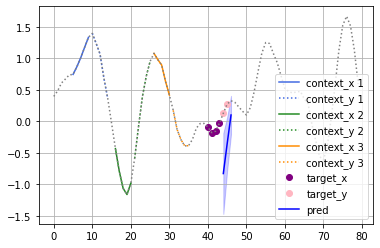

Update time per iter 0.33
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 4, 1])
Iteration: 162000, loss: 2.211030960083008
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

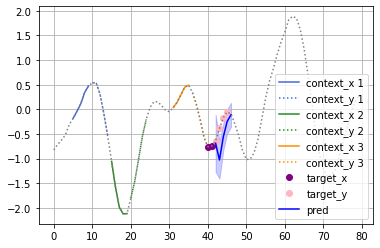

Update time per iter 0.36
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 3, 1])
Iteration: 163000, loss: 1.1196668148040771
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

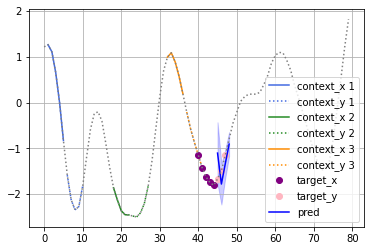

Update time per iter 0.35
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 4, 1])
Iteration: 164000, loss: -0.30405905842781067
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

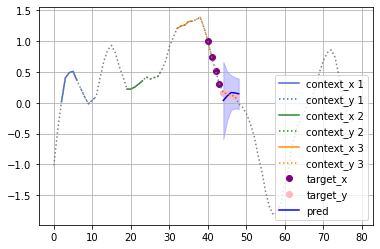

Update time per iter 0.33
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 4, 1])
Iteration: 165000, loss: 3.0947682857513428
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

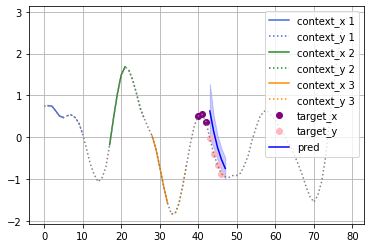

Update time per iter 0.35
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 3, 1])
Iteration: 166000, loss: 1.0353214740753174
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

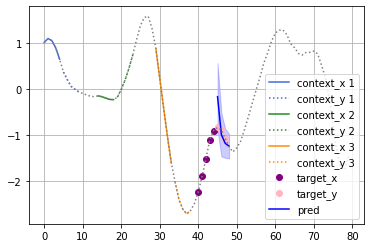

Update time per iter 0.34
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 5, 1])
Iteration: 167000, loss: 0.6768442392349243
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

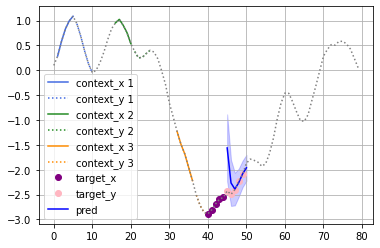

Update time per iter 0.33
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 3, 1])
Iteration: 168000, loss: 1.2536146640777588
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

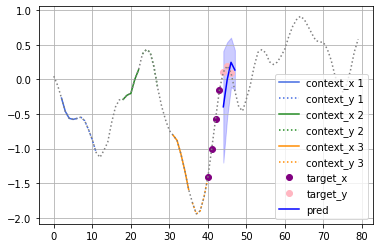

Update time per iter 0.35
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 3, 1])
Iteration: 169000, loss: 2.3517303466796875
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

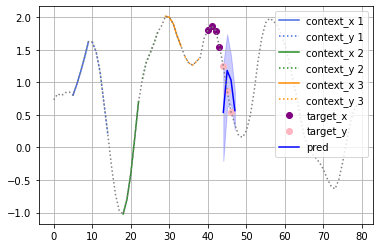

Update time per iter 0.35
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 3, 1])
Iteration: 170000, loss: 8.583070755004883
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

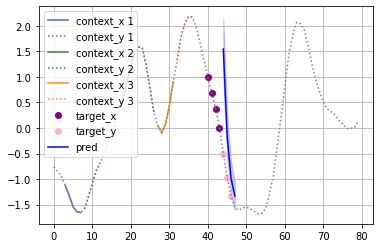

Update time per iter 0.36
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 2, 1])
Iteration: 171000, loss: 1.0956242084503174
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

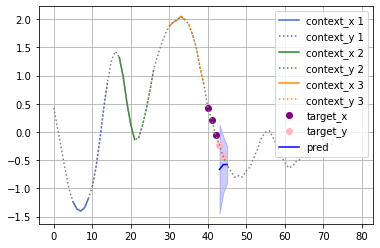

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 3, 1])
Iteration: 172000, loss: 2.3782830238342285
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

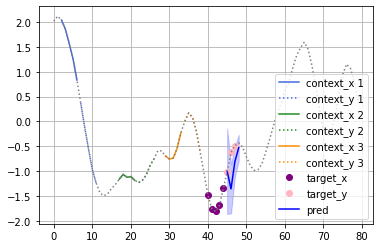

Update time per iter 0.34
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 3, 1])
Iteration: 173000, loss: 3.7930655479431152
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

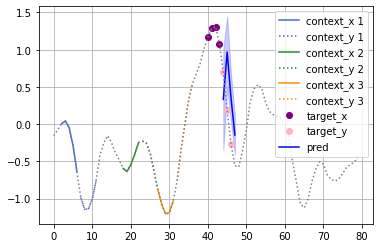

Update time per iter 0.37
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 4, 1])
Iteration: 174000, loss: 0.4393012523651123
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

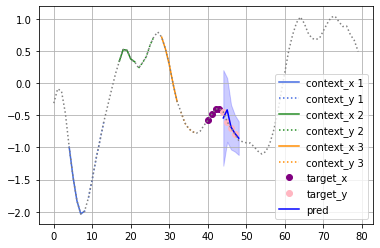

Update time per iter 0.35
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 5, 1])
Iteration: 175000, loss: 2.647428035736084
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

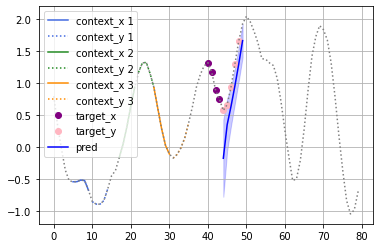

Update time per iter 0.34
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 2, 1])
Iteration: 176000, loss: 1.4279451370239258
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

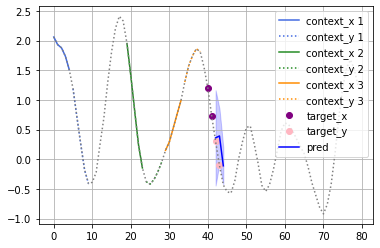

Update time per iter 0.35
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 2, 1])
Iteration: 177000, loss: 1.6290247440338135
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

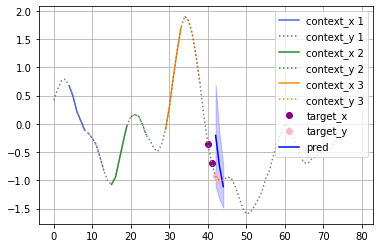

Update time per iter 0.34
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 5, 1])
Iteration: 178000, loss: 1.0321887731552124
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

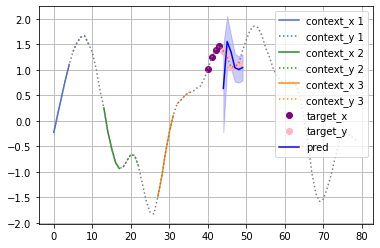

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 5, 1])
Iteration: 179000, loss: 1.8645756244659424
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

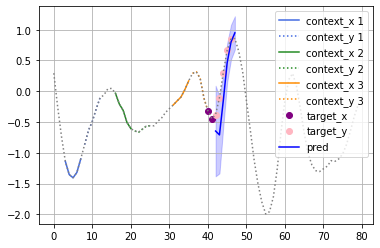

Update time per iter 0.08
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 2, 1])
Iteration: 180000, loss: 0.9786339998245239
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

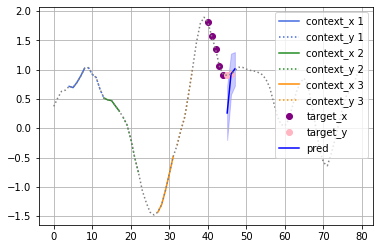

Update time per iter 0.18
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 2, 1])
Iteration: 181000, loss: 1.2999764680862427
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

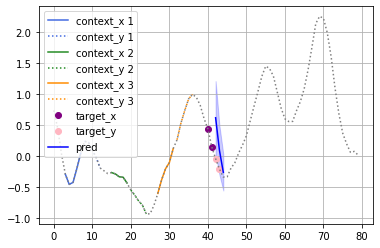

Update time per iter 0.34
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 4, 1])
Iteration: 182000, loss: 6.602569580078125
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

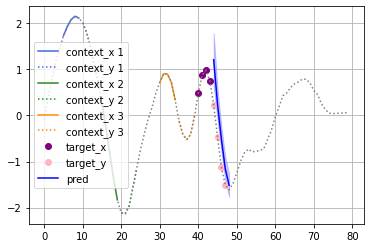

Update time per iter 0.37
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 4, 1])
Iteration: 183000, loss: 2.6592235565185547
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

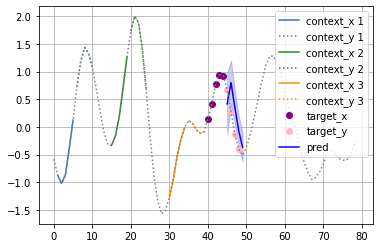

Update time per iter 0.26
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 4, 1])
Iteration: 184000, loss: 1.3337247371673584
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

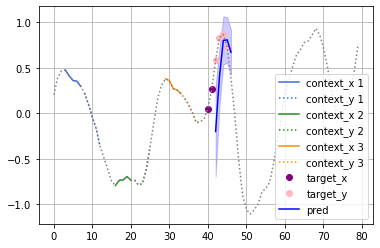

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 5, 1])
Iteration: 185000, loss: 2.307562828063965
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

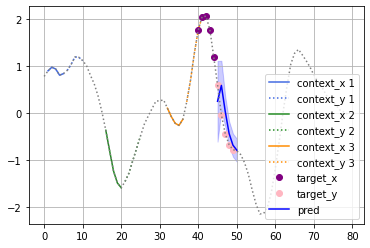

Update time per iter 0.36
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 3, 1])
Iteration: 186000, loss: 0.9033423662185669
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

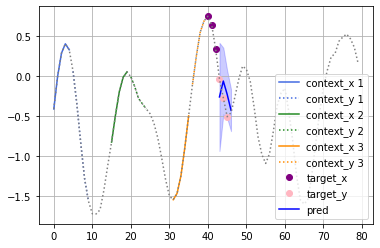

Update time per iter 0.34
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 5, 1])
Iteration: 187000, loss: 1.9180344343185425
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

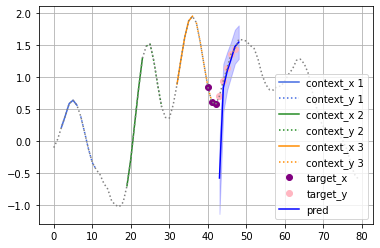

Update time per iter 0.34
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 3, 1])
Iteration: 188000, loss: 1.0913043022155762
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

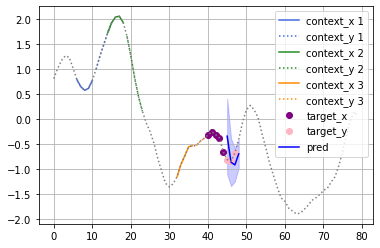

Update time per iter 0.34
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 5, 1])
Iteration: 189000, loss: 0.3032395839691162
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

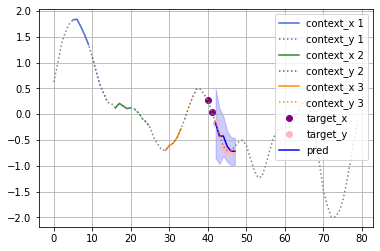

Update time per iter 0.29
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 4, 1])
Iteration: 190000, loss: 0.5757763385772705
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

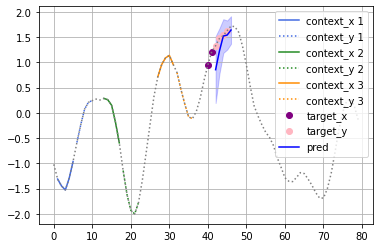

Update time per iter 0.35
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 4, 1])
Iteration: 191000, loss: 0.780095100402832
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

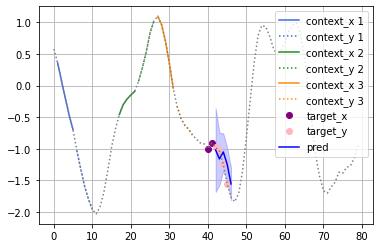

Update time per iter 0.09
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 2, 1])
Iteration: 192000, loss: 1.3072452545166016
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

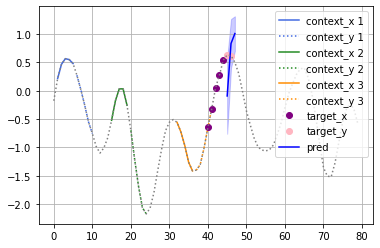

Update time per iter 0.35
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 2, 1])
Iteration: 193000, loss: 1.9538586139678955
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

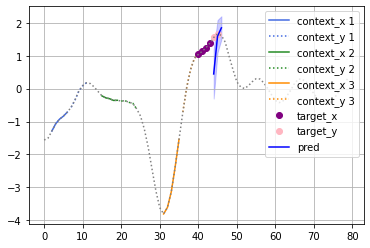

Update time per iter 0.33
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 4, 1])
Iteration: 194000, loss: 0.3061211109161377
pred_y: torch.Size([1, 5, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

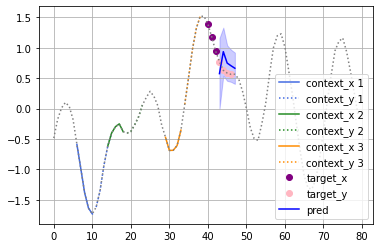

Update time per iter 0.29
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 3, 1])
Iteration: 195000, loss: 0.9643617868423462
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

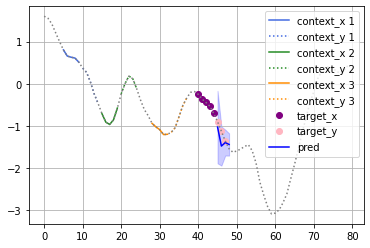

Update time per iter 0.34
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 2, 1])
target y: torch.Size([1, 2, 1])
Iteration: 196000, loss: 0.9109827280044556
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

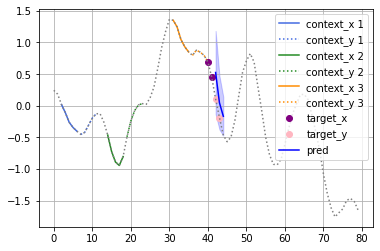

Update time per iter 0.37
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 5, 1])
target y: torch.Size([1, 2, 1])
Iteration: 197000, loss: 2.03732967376709
pred_y: torch.Size([1, 3, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

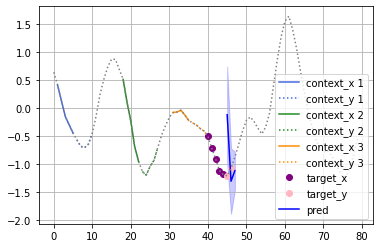

Update time per iter 0.30
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 4, 1])
target y: torch.Size([1, 5, 1])
Iteration: 198000, loss: -0.26387566328048706
pred_y: torch.Size([1, 6, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

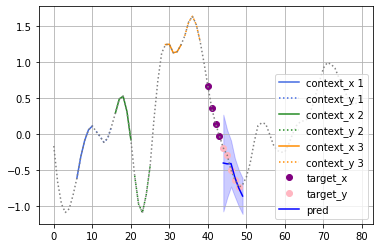

Update time per iter 0.07
Context x: torch.Size([1, 5, 1, 3])
Context y: torch.Size([1, 5, 1, 3])
target x: torch.Size([1, 3, 1])
target y: torch.Size([1, 3, 1])
Iteration: 199000, loss: 2.062758684158325
pred_y: torch.Size([1, 4, 1])


/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_1097673/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and

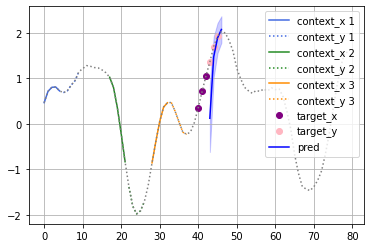

In [7]:
TRAINING_ITERATIONS = int(2e5)
PLOT_AFTER = int(1e3)
num_context = 3
len_context = 6
batch_size = 100
# The final output layer of the decoder outputs two values, one for the mean and
# one for the variance of the prediction at the target location
encoder_output_sizes = [64, 64]
decoder_output_sizes = [64, 64]
embedding_dim = 64

# Define the model
encoder_input_size = 1 + 1 # x and y pairs are encoder into the context
decoder_input_size = 64 + 1 + 1 # target is concatenated onto the representation as input into the decoder
model = ANP_RNN_Model(x_dim=1,
                      y_dim=1,
                      encoder_rnn_hidden_size_list=encoder_output_sizes,
                      decoder_rnn_hidden_size_list=decoder_output_sizes,
                      embedding_dim=embedding_dim,
                      context_concat='append',
                      use_cross_attention=True,
                      de_cross_attention_type='dot',
                      )

model = model.to(device)

# Set up the optimizer and train step
optimizer = torch.optim.Adam(model.parameters(), lr=1e-5)

timings = collections.deque(maxlen=10)
losses = []

for it in range(TRAINING_ITERATIONS):
    start_time = time.time()
    
    # Train dataset
    dataset_train = GPSeqCurvesReader(batch_size=batch_size, 
                                      num_contexts=num_context,
                                      len_context_x=len_context,
                                      len_context_y=len_context,
                                      len_target_x=len_context,
                                      len_target_y=len_context,
                                      testing=False)
    data_train = dataset_train.generate_curves()

    # Test dataset
    dataset_test = GPSeqCurvesReader(batch_size=1,
                                     num_contexts=num_context,
                                     len_context_x=len_context,
                                     len_context_y=len_context,
                                     len_target_x=len_context,
                                     len_target_y=len_context,
                                     testing=False)
    data_test = dataset_test.generate_curves()
    
    (context_x, context_y), target_x = data_train.query
    
    context_x = context_x.to(device)
    context_y = context_y.to(device)
    target_x  = target_x.to(device)
    target_y  = data_train.target_y.to(device)
    
    _, _, loss = model.forward(
            context_x,
            context_y,
            target_x,
            target_y,
        )
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    
    timings.append(time.time() - start_time)

    # Plot the predictions in `PLOT_AFTER` intervals
    if it % PLOT_AFTER == 0:
        
        print("Update time per iter {:.2f}".format(np.mean(timings)))
        
        (context_x, context_y), target_x = data_test.query
        context_x = context_x.to(device)
        context_y = context_y.to(device)
        target_x  = target_x.to(device)
        target_y  = data_test.target_y.to(device)
        
        # Get the predicted mean and variance at the target points for the testing set
        print("Context x: {}".format(context_x.shape))
        print("Context y: {}".format(context_y.shape))
        print("target x: {}".format(target_x.shape))
        print("target y: {}".format(target_y.shape))
        pred_y, var, loss = model.forward(
            context_x,
            context_y,
            target_x,
            target_y)
        test_loss = loss.detach().item()
        losses.append(loss)
        print('Iteration: {}, loss: {}'.format(it, test_loss))
        print("pred_y: {}".format(pred_y.shape))
        # Plot the prediction and the context
        plot_functions(
            num_context,
            data_test.left_intervals,
            data_test.len_seqs,
            data_test.full,
            target_x.cpu().numpy(),
            target_y.cpu().numpy(),
            context_x.cpu().numpy(),
            context_y.cpu().numpy(),
            pred_y.cpu().numpy(),
            var.cpu().numpy(),
        )

# MHXA

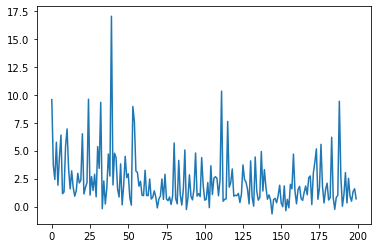

In [6]:
plt.plot([l.cpu().detach().numpy() for l in losses])
plt.show()

# DPXA

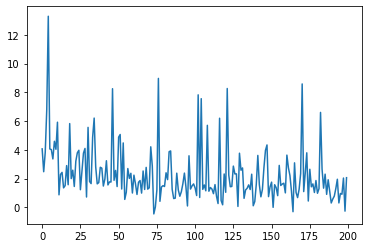

In [10]:
plt.plot([l.cpu().detach().numpy() for l in losses])
plt.show()

# XA + SA + stacking + latent path

Update time per iter 0.05
Iteration: 0, loss: 1.655890941619873


/nfs/home/samuelk/ml4f/data/gp_curves.py:263: UserWarning: torch.cholesky is deprecated in favor of torch.linalg.cholesky and will be removed in a future PyTorch release.
L = torch.cholesky(A)
should be replaced with
L = torch.linalg.cholesky(A)
and
U = torch.cholesky(A, upper=True)
should be replaced with
U = torch.linalg.cholesky(A).mH().
This transform will produce equivalent results for all valid (symmetric positive definite) inputs. (Triggered internally at  /opt/conda/conda-bld/pytorch_1646756402876/work/aten/src/ATen/native/BatchLinearAlgebra.cpp:1337.)
  cholesky = torch.cholesky(kernel.type(torch.DoubleTensor)).type(torch.FloatTensor)
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: co

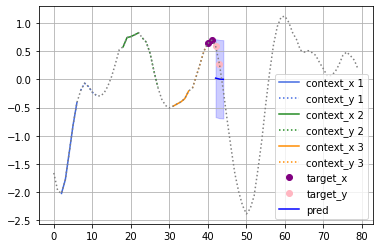

Update time per iter 0.04
Iteration: 1000, loss: -3.512951135635376


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

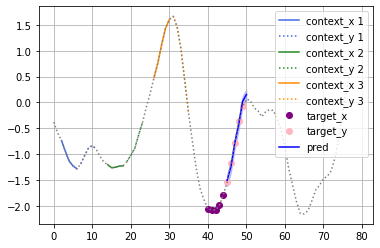

Update time per iter 0.04
Iteration: 2000, loss: -0.7888604402542114


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

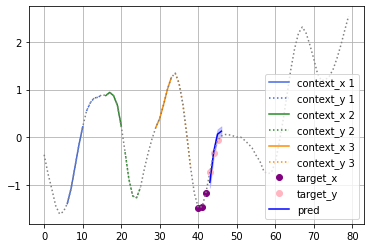

Update time per iter 0.04
Iteration: 3000, loss: -4.7260894775390625


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

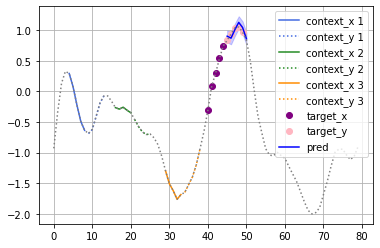

Update time per iter 0.04
Iteration: 4000, loss: -0.016746997833251953


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

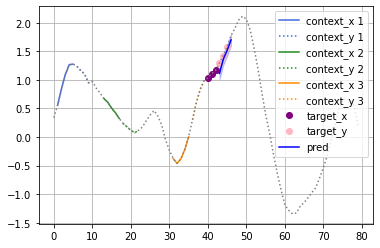

Update time per iter 0.04
Iteration: 5000, loss: -3.6430039405822754


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

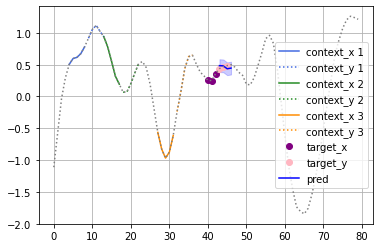

Update time per iter 0.04
Iteration: 6000, loss: -4.322782516479492


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

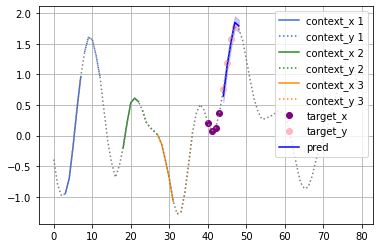

Update time per iter 0.05
Iteration: 7000, loss: -0.2139894962310791


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

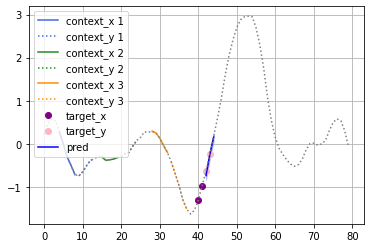

Update time per iter 0.04
Iteration: 8000, loss: -4.423280715942383


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

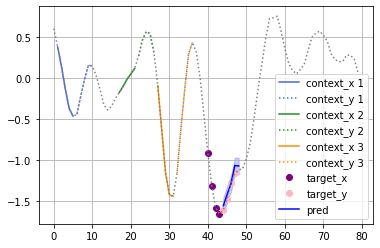

Update time per iter 0.04
Iteration: 9000, loss: -3.6489949226379395


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

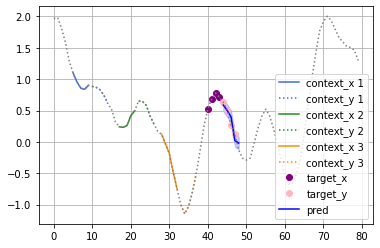

Update time per iter 0.04
Iteration: 10000, loss: 1.8718069791793823


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

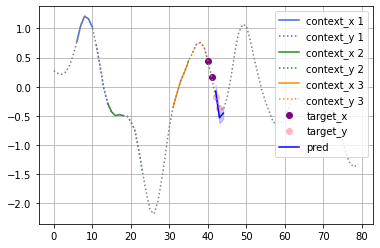

Update time per iter 0.04
Iteration: 11000, loss: -2.5949909687042236


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

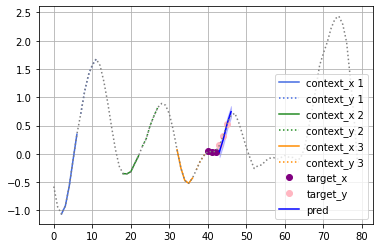

Update time per iter 0.04
Iteration: 12000, loss: -2.4325551986694336


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

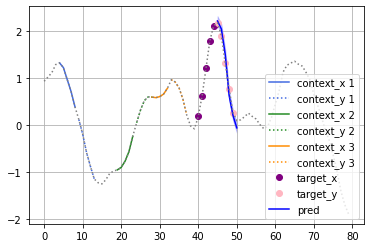

Update time per iter 0.04
Iteration: 13000, loss: -2.044496536254883


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

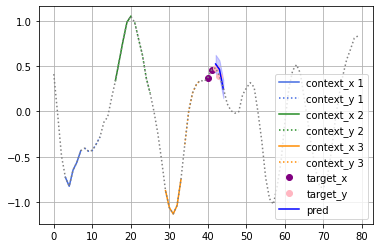

Update time per iter 0.04
Iteration: 14000, loss: 0.10107672214508057


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

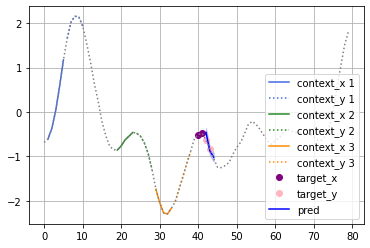

Update time per iter 0.04
Iteration: 15000, loss: 4.295644760131836


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

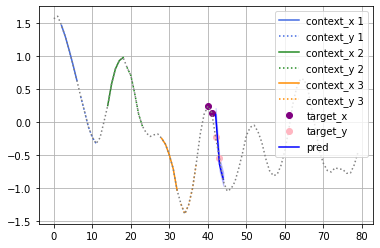

Update time per iter 0.04
Iteration: 16000, loss: -2.7100064754486084


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

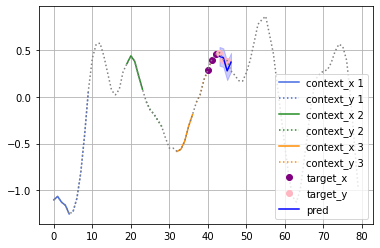

Update time per iter 0.04
Iteration: 17000, loss: -3.7133731842041016


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

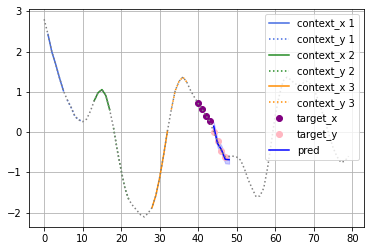

Update time per iter 0.04
Iteration: 18000, loss: -2.1836092472076416


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

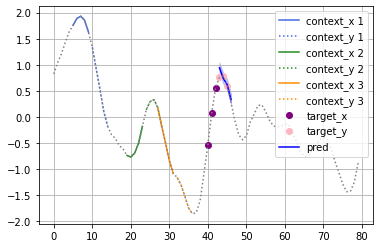

Update time per iter 0.04
Iteration: 19000, loss: -3.247661590576172


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

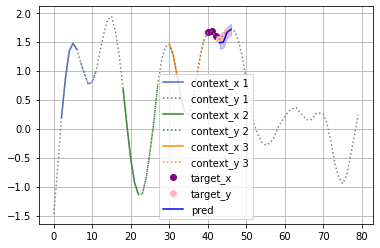

Update time per iter 0.04
Iteration: 20000, loss: -6.284346580505371


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

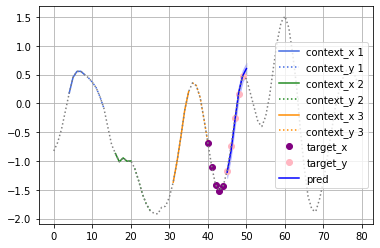

Update time per iter 0.04
Iteration: 21000, loss: -5.411581039428711


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

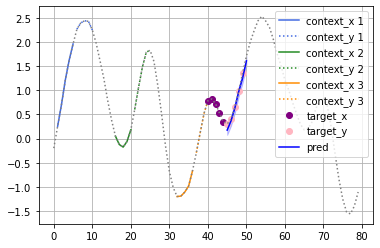

Update time per iter 0.04
Iteration: 22000, loss: -1.9957730770111084


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

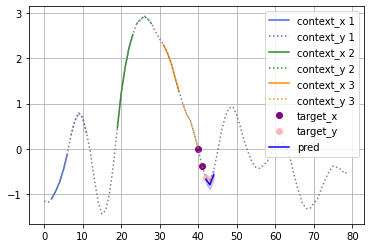

Update time per iter 0.04
Iteration: 23000, loss: -5.746194839477539


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

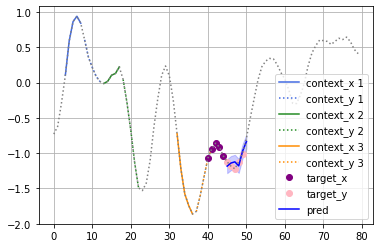

Update time per iter 0.04
Iteration: 24000, loss: -4.178225994110107


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

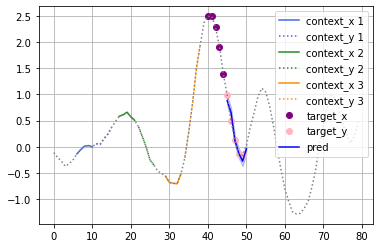

Update time per iter 0.04
Iteration: 25000, loss: -4.785529136657715


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

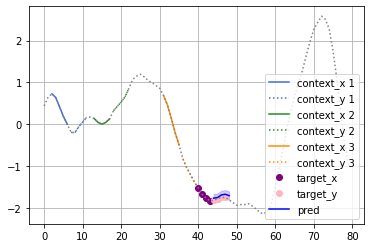

Update time per iter 0.04
Iteration: 26000, loss: -3.854853391647339


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

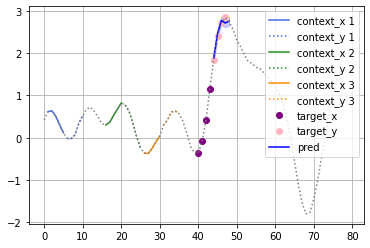

Update time per iter 0.04
Iteration: 27000, loss: -2.480987071990967


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

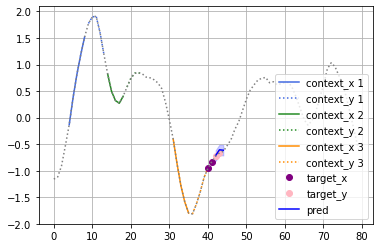

Update time per iter 0.04
Iteration: 28000, loss: -2.677093744277954


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

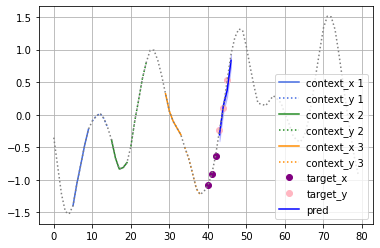

Update time per iter 0.04
Iteration: 29000, loss: -4.915694236755371


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

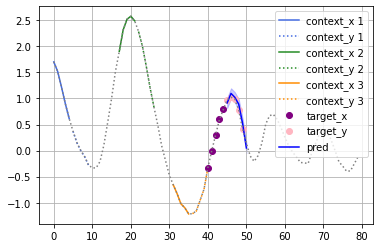

Update time per iter 0.04
Iteration: 30000, loss: -2.407428026199341


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

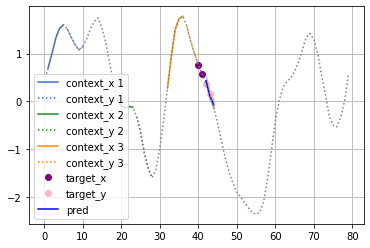

Update time per iter 0.04
Iteration: 31000, loss: -5.987014293670654


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

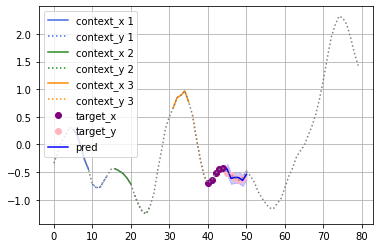

Update time per iter 0.04
Iteration: 32000, loss: -1.868105411529541


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

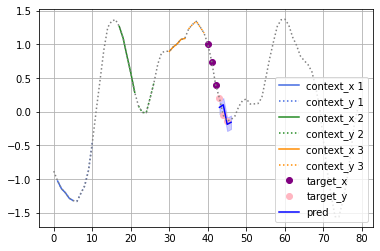

Update time per iter 0.04
Iteration: 33000, loss: -1.7624266147613525


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

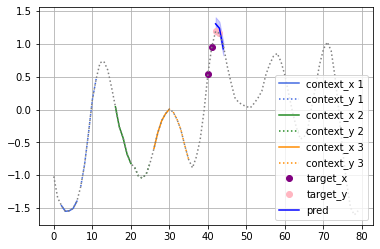

Update time per iter 0.05
Iteration: 34000, loss: -1.9361497163772583


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

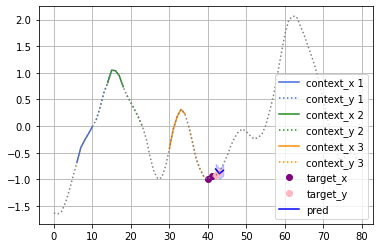

Update time per iter 0.04
Iteration: 35000, loss: -2.5264699459075928


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

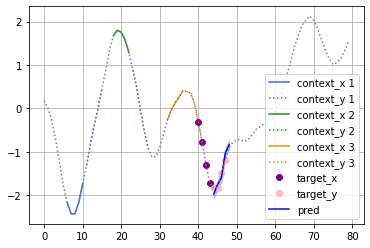

Update time per iter 0.04
Iteration: 36000, loss: -2.838637351989746


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

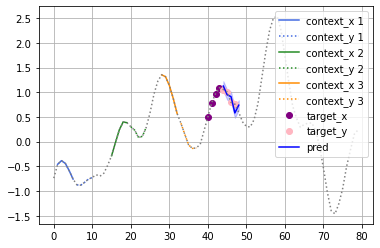

Update time per iter 0.04
Iteration: 37000, loss: -3.707427501678467


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

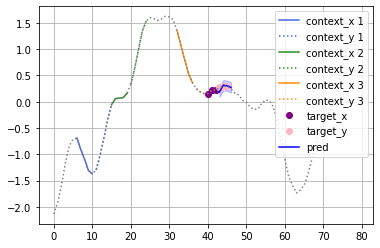

Update time per iter 0.04
Iteration: 38000, loss: -5.070413112640381


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

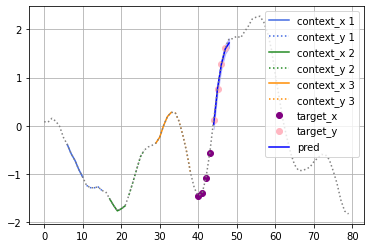

Update time per iter 0.04
Iteration: 39000, loss: -2.4418368339538574


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

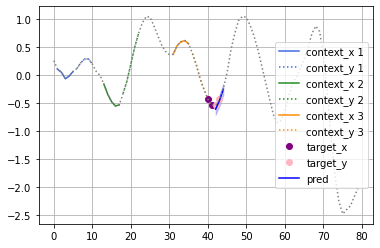

Update time per iter 0.04
Iteration: 40000, loss: -4.419397354125977


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

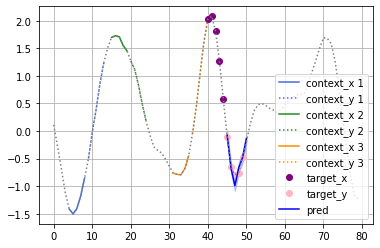

Update time per iter 0.04
Iteration: 41000, loss: -2.3691749572753906


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

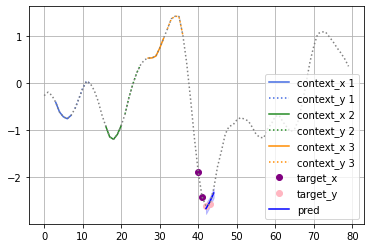

Update time per iter 0.04
Iteration: 42000, loss: -3.3055930137634277


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

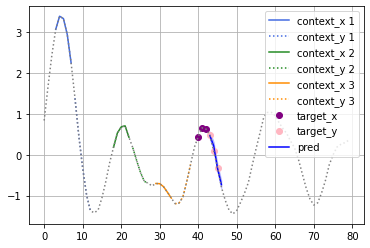

Update time per iter 0.04
Iteration: 43000, loss: -3.3760201930999756


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

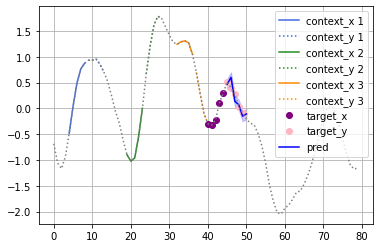

Update time per iter 0.04
Iteration: 44000, loss: -3.9420056343078613


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

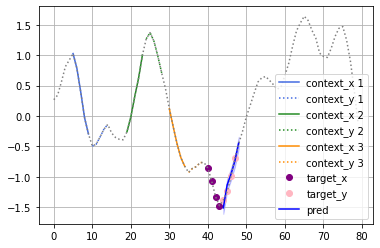

Update time per iter 0.04
Iteration: 45000, loss: -4.391393661499023


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

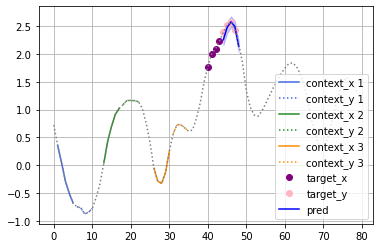

Update time per iter 0.04
Iteration: 46000, loss: -0.4565559923648834


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

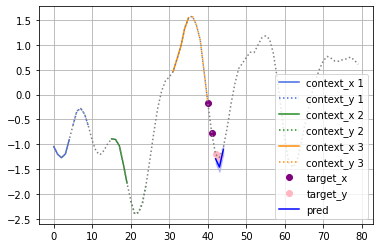

Update time per iter 0.04
Iteration: 47000, loss: -5.2143635749816895


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

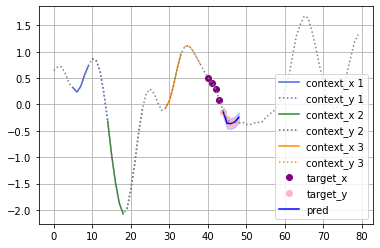

Update time per iter 0.04
Iteration: 48000, loss: -5.4626898765563965


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

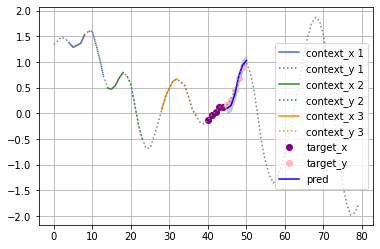

Update time per iter 0.04
Iteration: 49000, loss: -3.899928092956543


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

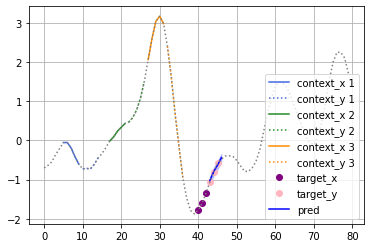

Update time per iter 0.04
Iteration: 50000, loss: -2.5483357906341553


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

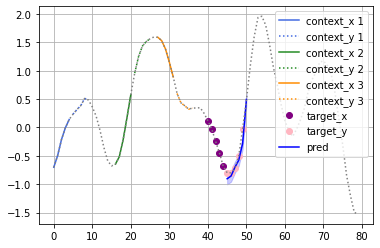

Update time per iter 0.04
Iteration: 51000, loss: -3.2190752029418945


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

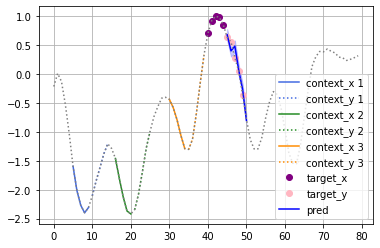

Update time per iter 0.04
Iteration: 52000, loss: -4.498153209686279


/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k:" (-> color='k'). The keyword argument will take precedence.
  plt.plot(range(left_interval[i] + len_seqs[0], left_interval[i] + len_seqs[0] + len_seqs[1]),
/tmp/ipykernel_187561/1575985254.py:38: UserWarning: color is redundantly defined by the 'color' keyword argument and the

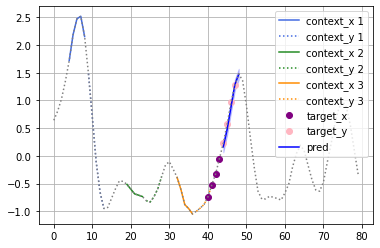

In [ ]:
TRAINING_ITERATIONS = int(2e5)
PLOT_AFTER = int(1e3)
num_context = 3
len_context = 6
batch_size = 100
# The final output layer of the decoder outputs two values, one for the mean and
# one for the variance of the prediction at the target location
encoder_output_sizes = [64, 64]
decoder_output_sizes = [64, 64]
embedding_dim = 64
latent_dim = 4

# Define the model
encoder_input_size = 1 + 1 # x and y pairs are encoder into the context
decoder_input_size = 64 + 1 + 1 # target is concatenated onto the representation as input into the decoder

model = ANP_RNN_Model(x_dim=1,
                      y_dim=1,
                      encoder_rnn_hidden_size_list=encoder_output_sizes,
                      decoder_rnn_hidden_size_list=decoder_output_sizes,
                      embedding_dim=embedding_dim,
                      latent_dim=latent_dim,
                      context_concat='stack',
                      use_cross_attention=True,
                      use_self_attention=True,
                      de_cross_attention_type='dot',
                      de_self_attention_type="dot",
                      latent_path=True,
                      )

model = model.to(device)

# Set up the optimizer and train step
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

timings = collections.deque(maxlen=10)
losses = []

for it in range(TRAINING_ITERATIONS):
    start_time = time.time()
    
    # Train dataset
    dataset_train = GPSeqCurvesReader(batch_size=batch_size, 
                                      num_contexts=num_context,
                                      len_context_x=len_context,
                                      len_context_y=len_context,
                                      len_target_x=len_context,
                                      len_target_y=len_context,
                                      testing=False)
    data_train = dataset_train.generate_curves()

    # Test dataset
    dataset_test = GPSeqCurvesReader(batch_size=1,
                                     num_contexts=num_context,
                                     len_context_x=len_context,
                                     len_context_y=len_context,
                                     len_target_x=len_context,
                                     len_target_y=len_context,
                                     testing=False)
    data_test = dataset_test.generate_curves()
    
    (context_x, context_y), target_x = data_train.query
    
    context_x = context_x.to(device)
    context_y = context_y.to(device)
    target_x  = target_x.to(device)
    target_y  = data_train.target_y.to(device)
    
    _, _, loss, kl = model.forward(
            context_x,
            context_y,
            target_x,
            target_y,
        )
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    
    timings.append(time.time() - start_time)

    # Plot the predictions in `PLOT_AFTER` intervals
    if it % PLOT_AFTER == 0:
        
        print("Update time per iter {:.2f}".format(np.mean(timings)))
        
        (context_x, context_y), target_x = data_test.query
        context_x = context_x.to(device)
        context_y = context_y.to(device)
        target_x  = target_x.to(device)
        target_y  = data_test.target_y.to(device)
        
        # Get the predicted mean and variance at the target points for the testing set
        pred_y, var, loss, kl = model.forward(
            context_x,
            context_y,
            target_x,
            target_y)
        test_loss = loss.detach().item()
        losses.append(loss)
        print('Iteration: {}, loss: {}'.format(it, test_loss))
        # Plot the prediction and the context
        plot_functions(
            num_context,
            data_test.left_intervals,
            data_test.len_seqs,
            data_test.full,
            target_x.cpu().numpy(),
            target_y.cpu().numpy(),
            context_x.cpu().numpy(),
            context_y.cpu().numpy(),
            pred_y.cpu().numpy(),
            var.cpu().numpy(),
        )

In [ ]:
plt.plot([l.cpu().detach().numpy() for l in losses])
plt.show()